# 1.Data & Preprocessing

### 1.1 Paths & hyper-parameters

In [2]:
from pathlib import Path

# === Change this to your root directory ===
ROOT = Path(r"D:\ELEC 5305 project\nsynth")

# Two sources (each should contain audio/ and an examples JSON)
SRC_TRAINVAL = ROOT / "nsynth"        # train/val source
SRC_TEST     = ROOT / "nsynth-test"   # test source

# Outputs
OUT_DIR   = ROOT / "processed_16k"     # processed audio written here
INDEX_CSV = ROOT / "index.csv"         # global split index
ATTRS_CSV = ROOT / "timbre_attrs.csv"  # optional timbre attributes

# Audio processing
SR_TARGET  = 16000
DUR_S      = 2.0
RMS_TARGET = 0.10

# Splits: nsynth → train/val only; nsynth-test → test only
TRAIN_RATIO = 0.9   # 90% train, 10% val for SRC_TRAINVAL
VAL_RATIO   = 0.1
SEED        = 2025

# Whether to compute extra timbre attributes (set False to skip)
COMPUTE_ATTRS = True


### 1.2 Utilities(resample/trim/normalize + JSON loader)

In [3]:
import math, json, random
import numpy as np
import pandas as pd
import soundfile as sf
from tqdm import tqdm
from scipy.signal import resample_poly, stft

def ensure_dir(p: Path) -> None:
    p.mkdir(parents=True, exist_ok=True)

def to_mono(x: np.ndarray) -> np.ndarray:
    """Convert to mono if input is (N, C)."""
    return x if x.ndim == 1 else np.mean(x, axis=1)

def resample_if_needed(x: np.ndarray, sr: int, sr_tgt: int) -> np.ndarray:
    """Polyphase resampling with integer up/down to avoid aliasing."""
    if sr == sr_tgt:
        return x
    g = math.gcd(sr, sr_tgt)
    up, down = sr_tgt // g, sr // g
    return resample_poly(x, up, down)

def fix_length_seconds(x: np.ndarray, sr: int, dur_s: float) -> np.ndarray:
    """Center-crop or zero-pad to a target duration in seconds."""
    n_tgt = int(round(dur_s * sr))
    if len(x) == n_tgt:
        return x
    if len(x) > n_tgt:
        start = (len(x) - n_tgt) // 2
        return x[start:start+n_tgt]
    y = np.zeros(n_tgt, dtype=x.dtype)
    y[:len(x)] = x
    return y

def rms_normalize(x: np.ndarray, rms_target: float) -> np.ndarray:
    """Normalize RMS to a target level and hard-clip to [-1, 1]."""
    rms = float(np.sqrt(np.mean(x**2) + 1e-12))
    if rms < 1e-6:
        return x
    y = x * (rms_target / rms)
    return np.clip(y, -1.0, 1.0)

# A lightweight instrument → family map (extend as needed)
FAMILY_MAP = {
    "acoustic_guitar":"string","electric_guitar":"string","guitar":"string",
    "violin":"string","viola":"string","cello":"string","contrabass":"string",
    "flute":"woodwind","clarinet":"woodwind","oboe":"woodwind","bassoon":"woodwind",
    "trumpet":"brass","trombone":"brass","tuba":"brass","french_horn":"brass",
    "piano":"keyboard","organ":"keyboard","harpsichord":"keyboard",
    "voice":"vocal","vocal":"vocal","choir":"vocal",
    "reed":"reed","harmonica":"reed","accordion":"reed",
    "bass":"bass","double_bass":"bass"
}

def load_examples_json(src_dir: Path) -> dict:
    """
    Load the NSynth-style metadata JSON.
    File is usually named 'examples' or 'examples.json'.
    Returns a dict: key (note_id or filename stem) -> {instrument, pitch, velocity}.
    """
    candidates = [src_dir / "examples", src_dir / "examples.json"]
    for p in candidates:
        if p.exists():
            data = json.loads(p.read_text(encoding="utf-8"))
            idx = {}
            for k, meta in data.items():
                stem_key = (meta.get("note_str") or k).split(".")[0].lower()
                idx[stem_key] = {
                    "instrument": (meta.get("instrument_str") or meta.get("instrument") or "unknown").lower(),
                    "pitch": int(meta.get("pitch", -1)),
                    "velocity": int(meta.get("velocity", -1)),
                }
            return idx
    print(f"⚠ No 'examples' JSON found in {src_dir}. Labels will be 'unknown'.")
    return {}


### 1.3 Scan the two sources

In [4]:
def scan_source(src_root: Path, split_hint: str) -> list[dict]:
    """
    Scan a source folder that contains 'audio/' and 'examples' JSON.
    split_hint:
      - 'trainval' → will be split into train/val later
      - 'test'     → kept as test
    """
    meta = load_examples_json(src_root)
    audio_dir = src_root / "audio"
    wavs = list(audio_dir.rglob("*.wav"))
    rows = []
    for wav in wavs:
        stem = wav.stem.lower()
        m = meta.get(stem, {"instrument":"unknown","pitch":-1,"velocity":-1})
        inst = m["instrument"]
        fam  = FAMILY_MAP.get(inst, "other")
        rows.append({
            "path_raw": str(wav),
            "instrument": inst,
            "family": fam,
            "pitch": m["pitch"],
            "velocity": m["velocity"],
            "split_hint": split_hint
        })
    return rows

rows_trainval = scan_source(SRC_TRAINVAL, "trainval")
rows_test     = scan_source(SRC_TEST, "test")

all_rows = rows_trainval + rows_test
print(f"SRC_TRAINVAL files: {len(rows_trainval)} | SRC_TEST files: {len(rows_test)} | total: {len(all_rows)}")
pd.DataFrame(all_rows).head()


SRC_TRAINVAL files: 12678 | SRC_TEST files: 4096 | total: 16774


,path_raw,instrument,family,pitch,velocity,split_hint
0,D:\ELEC 5305 project\nsynth\nsynth\audio\bass_...,bass_electronic_018,other,22,25,trainval
1,D:\ELEC 5305 project\nsynth\nsynth\audio\bass_...,bass_electronic_018,other,22,50,trainval
2,D:\ELEC 5305 project\nsynth\nsynth\audio\bass_...,bass_electronic_018,other,22,75,trainval
3,D:\ELEC 5305 project\nsynth\nsynth\audio\bass_...,bass_electronic_018,other,22,127,trainval
4,D:\ELEC 5305 project\nsynth\nsynth\audio\bass_...,bass_electronic_018,other,23,50,trainval


### 1.4 Process audio (16k/2s/RMS)

In [5]:
random.seed(SEED)
ensure_dir(OUT_DIR)

processed = []
errors = 0

for r in tqdm(all_rows, desc="Processing audio"):
    try:
        x, sr = sf.read(r["path_raw"], always_2d=False)
        x = to_mono(x).astype(np.float32, copy=False)
        x = resample_if_needed(x, sr, SR_TARGET)
        x = fix_length_seconds(x, SR_TARGET, DUR_S)
        x = rms_normalize(x, RMS_TARGET)

        # Output path: processed_16k/<instrument>/<original_name>.wav
        out_cls = OUT_DIR / r["instrument"]
        ensure_dir(out_cls)
        out_path = out_cls / Path(r["path_raw"]).name
        sf.write(str(out_path), x, SR_TARGET, subtype="PCM_16")

        r_new = dict(r)
        r_new["path"] = str(out_path)
        processed.append(r_new)
    except Exception as e:
        errors += 1
        if errors < 10:
            print("[ERR]", r["path_raw"], "->", e)

print(f"Processed OK={len(processed)}, Failed={errors}")
df_proc = pd.DataFrame(processed)
df_proc.head()


Processing audio: 100%|██████████| 16774/16774 [01:00<00:00, 276.96it/s]

Processed OK=16774, Failed=0


,path_raw,instrument,family,pitch,velocity,split_hint,path
0,D:\ELEC 5305 project\nsynth\nsynth\audio\bass_...,bass_electronic_018,other,22,25,trainval,D:\ELEC 5305 project\nsynth\processed_16k\bass...
1,D:\ELEC 5305 project\nsynth\nsynth\audio\bass_...,bass_electronic_018,other,22,50,trainval,D:\ELEC 5305 project\nsynth\processed_16k\bass...
2,D:\ELEC 5305 project\nsynth\nsynth\audio\bass_...,bass_electronic_018,other,22,75,trainval,D:\ELEC 5305 project\nsynth\processed_16k\bass...
3,D:\ELEC 5305 project\nsynth\nsynth\audio\bass_...,bass_electronic_018,other,22,127,trainval,D:\ELEC 5305 project\nsynth\processed_16k\bass...
4,D:\ELEC 5305 project\nsynth\nsynth\audio\bass_...,bass_electronic_018,other,23,50,trainval,D:\ELEC 5305 project\nsynth\processed_16k\bass...


### 1.5 Make the splits and export

In [6]:
from collections import defaultdict
import numpy as np

df = df_proc.copy()

# Initialize split: 'test' stays test; 'trainval' will be split below.
df["split"] = np.where(df["split_hint"]=="test", "test", "trainval")

# Stratified splitting on the trainval portion by 'instrument'
mask_tv = (df["split"]=="trainval")
df_tv = df[mask_tv].copy()

by_cls = defaultdict(list)
for i, row in df_tv.iterrows():
    by_cls[row["instrument"]].append(i)

random.seed(SEED)
assigned = {}

for cls, idxs in by_cls.items():
    random.shuffle(idxs)
    n = len(idxs)
    n_tr = int(n * TRAIN_RATIO)
    # Remaining goes to val (no train/test overlap for nsynth)
    for j, idx in enumerate(idxs):
        assigned[idx] = "train" if j < n_tr else "val"

df.loc[mask_tv, "split"] = df_tv.index.map(assigned)

# Final index file for training
index_cols = ["path","split","instrument","family","pitch","velocity"]
df[index_cols].to_csv(INDEX_CSV, index=False, encoding="utf-8")
print("index.csv written to:", INDEX_CSV)

# Quick summary
display(df.groupby(["split","instrument"]).size().unstack(fill_value=0).head())


index.csv written to: D:\ELEC 5305 project\nsynth\index.csv


instrument,bass_electronic_018,bass_electronic_025,bass_electronic_027,bass_synthetic_009,bass_synthetic_033,bass_synthetic_034,bass_synthetic_068,bass_synthetic_098,bass_synthetic_134,bass_synthetic_135,...,reed_acoustic_023,reed_acoustic_037,string_acoustic_012,string_acoustic_014,string_acoustic_056,string_acoustic_057,string_acoustic_071,string_acoustic_080,vocal_acoustic_000,vocal_synthetic_003
split,,,,,,,,,,,,,,,,,,,,,
test,50,53,57,119,105,55,108,92,97,107,...,73,58,46,58,62,56,43,41,22,119
train,144,141,137,288,301,140,298,313,308,299,...,235,154,102,136,142,138,105,107,74,288
val,16,16,16,33,34,16,34,35,35,34,...,27,18,12,16,16,16,12,12,9,33


### 1.6 Export timbre attributes to timbre_attrs.csv

In [7]:
if COMPUTE_ATTRS:
    def compute_timbre_attrs(x: np.ndarray, sr: int) -> dict:
        """Frame-level STFT stats aggregated into clip-level attributes."""
        nperseg, noverlap = 1024, 1024-256
        f, t, Z = stft(x, fs=sr, nperseg=nperseg, noverlap=noverlap,
                       window="hann", padded=True, boundary="zeros")
        mag = np.abs(Z) + 1e-12
        psd = mag**2
        psd_sum = np.sum(psd, axis=0, keepdims=True) + 1e-12

        freqs = f[:, None]
        centroid = np.sum(freqs * psd, axis=0) / np.sum(psd, axis=0)
        spread   = np.sqrt(np.sum(((freqs-centroid[None,:])**2) * psd, axis=0) / np.sum(psd, axis=0))
        flatness = np.exp(np.mean(np.log(psd+1e-12), axis=0)) / (np.mean(psd, axis=0) + 1e-12)

        cumsum_psd = np.cumsum(psd, axis=0)
        thresh = 0.95 * psd_sum
        roll_idx = (cumsum_psd < thresh).sum(axis=0)
        rolloff = f[np.clip(roll_idx, 0, len(f)-1)]

        return {
            "spec_centroid_mean": float(np.mean(centroid)),
            "spec_centroid_std":  float(np.std(centroid)),
            "spec_spread_mean":   float(np.mean(spread)),
            "spec_spread_std":    float(np.std(spread)),
            "spec_flatness_mean": float(np.mean(flatness)),
            "spec_flatness_std":  float(np.std(flatness)),
            "spec_rolloff95_mean":float(np.mean(rolloff)),
            "spec_rolloff95_std": float(np.std(rolloff)),
        }

    rows_attr = []
    for _, r in tqdm(df.iterrows(), total=len(df), desc="Computing timbre attrs"):
        try:
            x, sr = sf.read(r["path"], always_2d=False)
            x = to_mono(x).astype(np.float32, copy=False)  # already 16k/2s/RMS from previous cell
            attrs = compute_timbre_attrs(x, SR_TARGET)
            attrs.update({"path": r["path"], "instrument": r["instrument"], "family": r["family"]})
            rows_attr.append(attrs)
        except Exception:
            pass

    pd.DataFrame(rows_attr).to_csv(ATTRS_CSV, index=False, encoding="utf-8")
    print("timbre_attrs.csv written to:", ATTRS_CSV)
else:
    print("Skipped timbre attribute computation.")


Computing timbre attrs: 100%|██████████| 16774/16774 [01:44<00:00, 160.32it/s]


timbre_attrs.csv written to: D:\ELEC 5305 project\nsynth\timbre_attrs.csv


# 2. Multi-View Time-Frequency Representations

### 2.1 paths & knobs

In [12]:
from pathlib import Path

# === project root ===
ROOT = Path(r"D:\ELEC 5305 project\nsynth")

# inputs
INDEX_CSV = ROOT / "index.csv"              # from step-1
SR        = 16000                           # audio sample rate

# outputs (feature caches + plots + normalization stats)
FEAT_DIR  = ROOT / "features_stft_cqt"      # will contain /stft /cqt and a manifest.csv
PLOT_DIR  = ROOT / "plots_features"         # inspection figures
STATS_NPZ = ROOT / "feature_stats.npz"      # global mean/std for normalization

# STFT
STFT_NFFT   = 1024
STFT_HOP    = 256
STFT_WIN    = "hann"

# CQT
CQT_BPO     = 12          # bins per octave
CQT_OCT     = 8           # total octaves
CQT_FMIN    = 32.703      # ~C1

# visualization sampling
N_PER_SPLIT = 4           # how many items per split to plot

FEAT_DIR.mkdir(parents=True, exist_ok=True)
(PLOT_DIR).mkdir(parents=True, exist_ok=True)
(FEAT_DIR / "stft").mkdir(parents=True, exist_ok=True)
(FEAT_DIR / "cqt").mkdir(parents=True, exist_ok=True)

print("Paths ready.")


Paths ready.


### 2.2 feature extractors (STFT / CQT) and I/O utils

In [15]:
import math, json, random
import numpy as np
import pandas as pd
import soundfile as sf
import librosa
from scipy.signal import resample_poly
from tqdm import tqdm

def load_wav_mono(path: str, sr: int) -> np.ndarray:
    """Load a mono waveform; resample to target sr if needed."""
    x, s = sf.read(path, always_2d=False)
    if x.ndim > 1:
        x = x.mean(axis=1)
    if s != sr:
        g = math.gcd(s, sr)
        x = resample_poly(x, sr//g, s//g)
    return x.astype(np.float32, copy=False)

def stft_logmag(x: np.ndarray, n_fft=STFT_NFFT, hop_length=STFT_HOP, window=STFT_WIN) -> np.ndarray:
    """Return log(1+|STFT|) with shape [F, T]."""
    S = librosa.stft(x, n_fft=n_fft, hop_length=hop_length, window=window, center=True)
    M = np.log1p(np.abs(S))
    return M.astype(np.float32)

def cqt_logmag(
    x: np.ndarray,
    sr: int = SR,
    bpo: int = CQT_BPO,
    octs: int = CQT_OCT,
    fmin: float = CQT_FMIN,
    hop_length: int = STFT_HOP,   # make it explicit int
    safety: float = 0.98,         # margin below Nyquist
) -> np.ndarray:
    """
    Safe and numba-friendly CQT:
      - cast input to float64 before calling librosa.cqt (numba prefers float64)
      - clamp n_bins so fmax <= Nyquist*safety
      - use explicit integer hop_length
      - return log(1+|CQT|) as float32
    """
    # --- safety clamp for n_bins ---
    nyq_safe = (sr * 0.5) * float(safety)
    fmin = float(fmin)
    bpo  = int(bpo)
    req_bins = int(bpo * int(octs))
    # allow at least 1 bin even if fmin > nyq_safe
    max_bins_allowed = int(np.floor(bpo * np.log2(max(nyq_safe / max(fmin, 1e-9), 1e-9))))
    n_bins = int(max(1, min(req_bins, max_bins_allowed)))

    # --- make inputs numba-friendly ---
    x64 = np.asarray(x, dtype=np.float64, order="C")
    hop_length = int(hop_length)

    # --- compute CQT ---
    C = librosa.cqt(
        x64,
        sr=sr,
        fmin=fmin,
        bins_per_octave=bpo,
        n_bins=n_bins,
        hop_length=hop_length,
    )
    M = np.log1p(np.abs(C))
    return M.astype(np.float32)




### 2.3 plotting helpers

In [26]:
import matplotlib.pyplot as plt
from pathlib import Path
import numpy as np

def plot_wave_stft_cqt(
    wav_path: str,
    out_png: str | Path | None = None,
    show_inline: bool = False
):
    """
    Draw waveform + STFT logmag + CQT logmag in a clean layout.
    - Uses constrained_layout to avoid title/axes/colorbar overlaps.
    - If `out_png` is provided, the figure is saved.
    - If `show_inline` is True, the fig is returned (caller should `plt.show()`).
    """
    # --- data ---
    x = load_wav_mono(wav_path, SR)
    S = stft_logmag(x)     # [F, T]
    C = cqt_logmag(x)      # [K, T]

    # --- figure ---
    fig = plt.figure(figsize=(12, 7), constrained_layout=True)
    # if older mpl ignores constrained_layout, we will call tight_layout() later
    gs = fig.add_gridspec(3, 1, height_ratios=[1, 2, 2])

    # waveform
    ax0 = fig.add_subplot(gs[0, 0])
    t = np.arange(len(x)) / SR
    ax0.plot(t, x, linewidth=0.9)
    ax0.set_title("Waveform", pad=6)
    ax0.set_xlabel("Time (s)")
    ax0.set_ylabel("Amplitude")

    # STFT
    ax1 = fig.add_subplot(gs[1, 0])
    im1 = ax1.imshow(S, origin="lower", aspect="auto", cmap="magma")
    ax1.set_title(f"STFT log-magnitude  (F={S.shape[0]}, T={S.shape[1]})", pad=6)
    ax1.set_xlabel("Frames")
    ax1.set_ylabel("Bins")
    fig.colorbar(im1, ax=ax1, fraction=0.046, pad=0.04)  # slimmer cbar, more padding

    # CQT
    ax2 = fig.add_subplot(gs[2, 0])
    im2 = ax2.imshow(C, origin="lower", aspect="auto", cmap="viridis")
    ax2.set_title(f"CQT log-magnitude  (K={C.shape[0]}, T={C.shape[1]})", pad=6)
    ax2.set_xlabel("Frames")
    ax2.set_ylabel("Bins")
    fig.colorbar(im2, ax=ax2, fraction=0.046, pad=0.04)

    # fallback for older mpl (if titles still look tight)
    try:
        fig.canvas.draw()  # trigger layout engine once
    except Exception:
        pass
    try:
        # if constrained_layout is ignored, tighten once
        fig.tight_layout()
    except Exception:
        pass

    # save if needed
    if out_png is not None:
        out_png = Path(out_png)
        out_png.parent.mkdir(parents=True, exist_ok=True)
        fig.savefig(out_png, dpi=150, bbox_inches="tight")

    if show_inline:
        return fig

    plt.close(fig)


### 2.4 Visualize a few samples per split and save PNGs

split
test      4096
train    11382
val       1296
dtype: int64

=== Showing train examples (3) ===
[train] #0 -> guitar_electronic_028-106-050.wav | instrument=guitar_electronic_028 | family=other


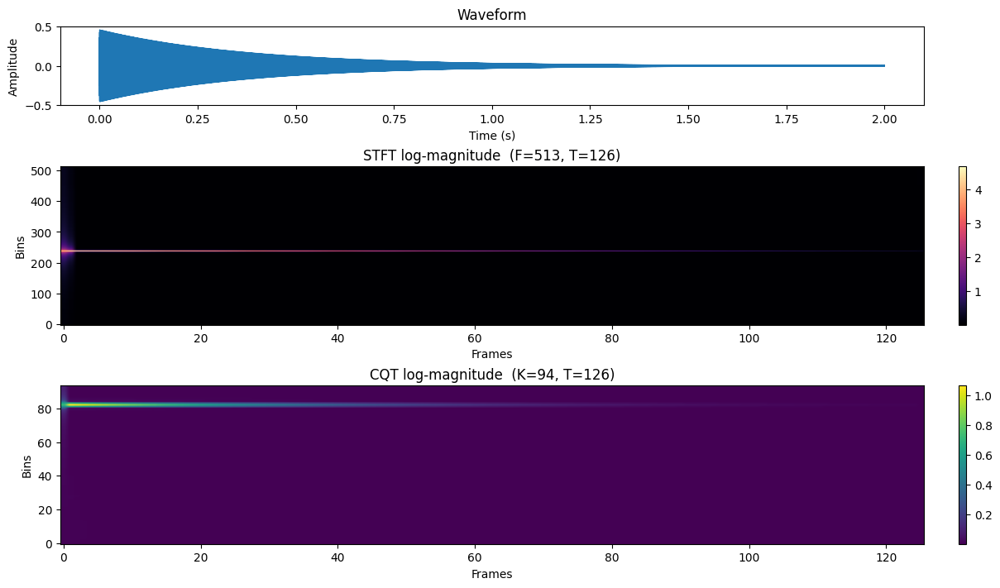

[train] #1 -> reed_acoustic_018-083-025.wav | instrument=reed_acoustic_018 | family=other


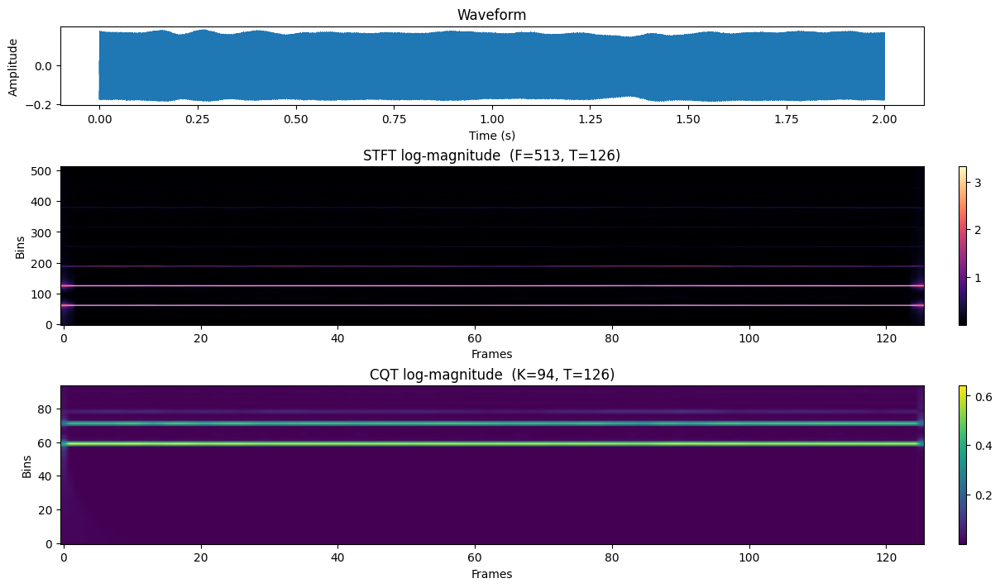

[train] #2 -> guitar_acoustic_010-051-050.wav | instrument=guitar_acoustic_010 | family=other


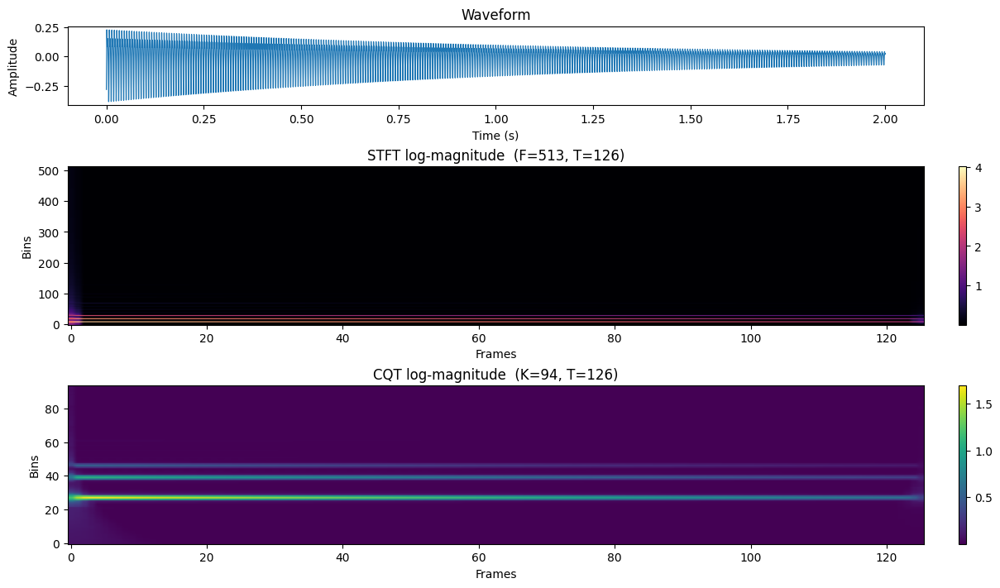


=== Showing val examples (3) ===
[val] #0 -> brass_acoustic_006-052-025.wav | instrument=brass_acoustic_006 | family=other


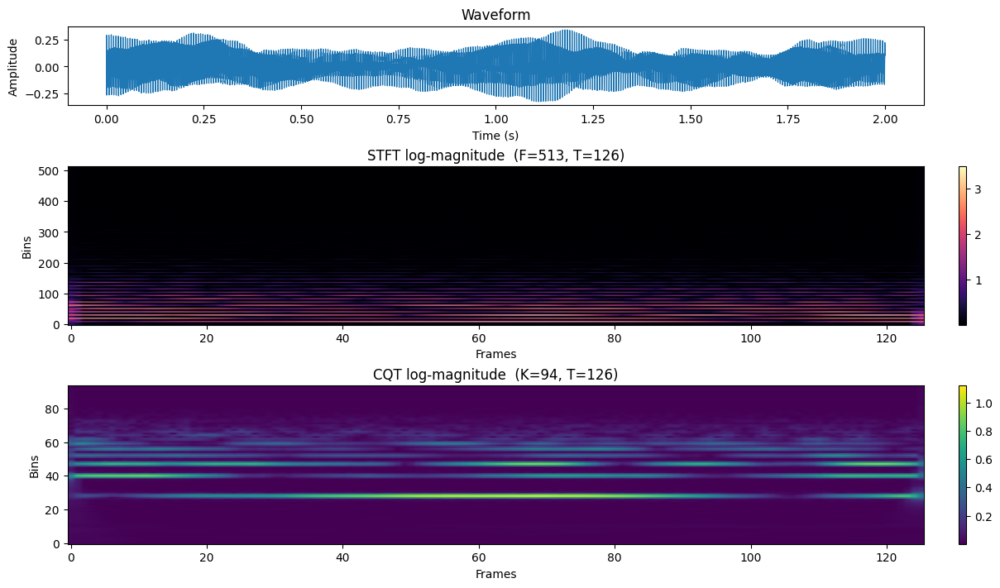

[val] #1 -> string_acoustic_012-054-127.wav | instrument=string_acoustic_012 | family=other


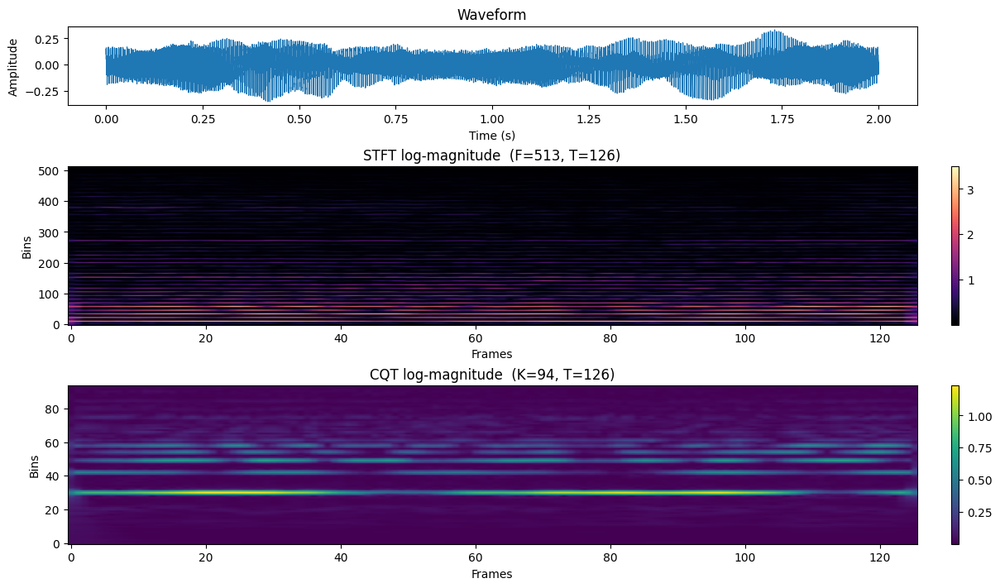

[val] #2 -> bass_electronic_018-058-127.wav | instrument=bass_electronic_018 | family=other


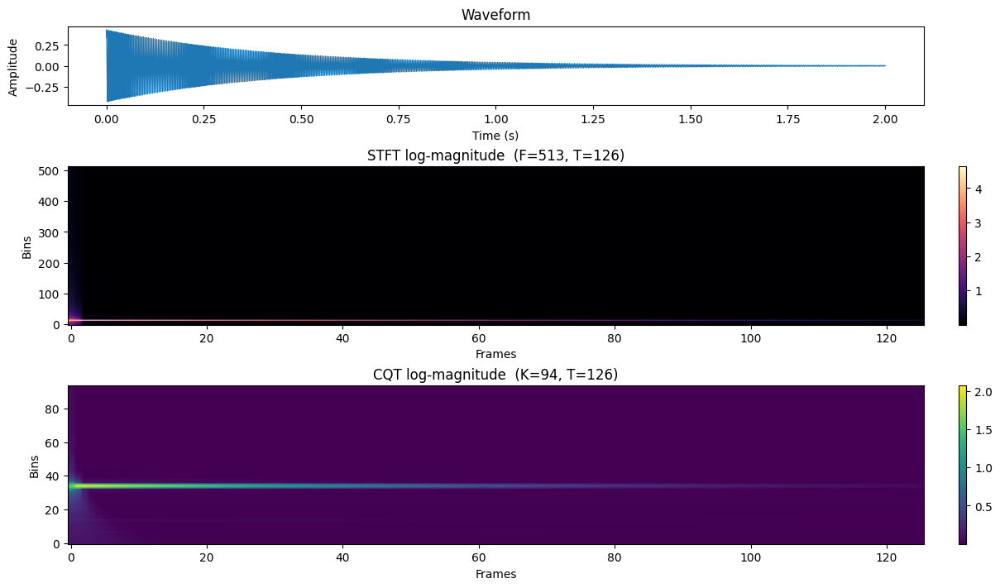


=== Showing test examples (3) ===
[test] #0 -> guitar_electronic_028-092-127.wav | instrument=guitar_electronic_028 | family=other


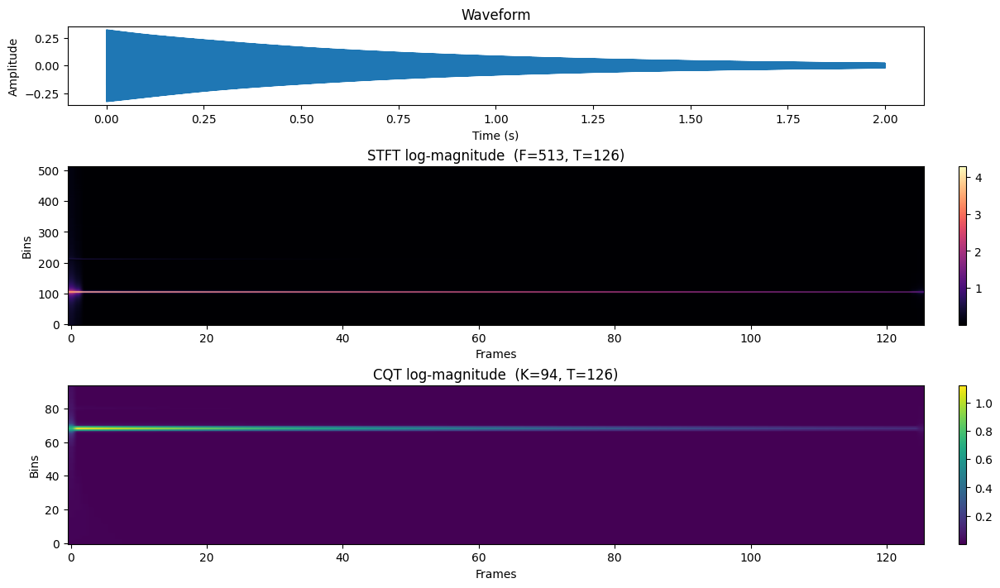

[test] #1 -> mallet_acoustic_056-091-100.wav | instrument=mallet_acoustic_056 | family=other


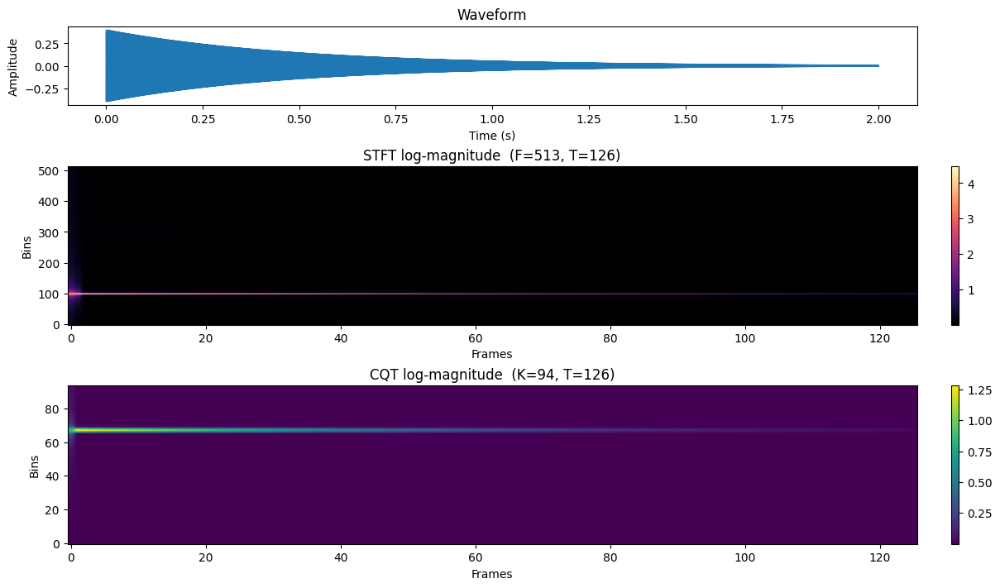

[test] #2 -> string_acoustic_014-037-050.wav | instrument=string_acoustic_014 | family=other


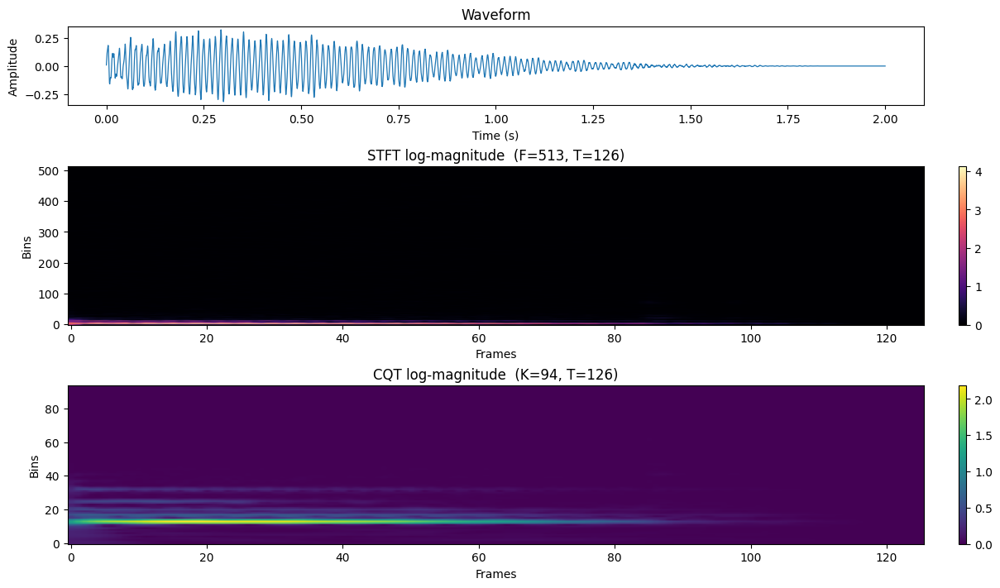

In [27]:
import pandas as pd
from pathlib import Path
import matplotlib.pyplot as plt

df = pd.read_csv(INDEX_CSV)
print(df.groupby("split").size())

N_SHOW = 3  # number of examples per split

for split in ["train", "val", "test"]:
    df_s = df[df["split"] == split]
    if df_s.empty:
        continue

    subset = df_s.sample(min(N_SHOW, len(df_s)), random_state=2025)
    print(f"\n=== Showing {split} examples ({len(subset)}) ===")
    for i, row in subset.reset_index(drop=True).iterrows():
        wav_path = Path(row["path"])
        print(f"[{split}] #{i} -> {wav_path.name} | instrument={row['instrument']} | family={row['family']}")
        fig = plot_wave_stft_cqt(str(wav_path), out_png=None, show_inline=True)
        # 为兼容性再加一层安全布局
        try:
            fig.set_constrained_layout(True)
            fig.canvas.draw()
        except Exception:
            pass
        try:
            fig.tight_layout()
        except Exception:
            pass
        plt.show()


### 2.5 Build feature cache (STFT/CQT) for the whole dataset

In [20]:
MANIFEST_CSV = FEAT_DIR / "manifest.csv"  # records of feature files

rows_manifest = []
for _, row in tqdm(df.iterrows(), total=len(df), desc="Caching features"):
    p = Path(row["path"])
    x = load_wav_mono(str(p), SR)
    S = stft_logmag(x)  # [F, T]
    C = cqt_logmag(x)   # [K, T]

    # save .npy paths
    stft_out = FEAT_DIR / "stft" / (p.stem + ".npy")
    cqt_out  = FEAT_DIR / "cqt"  / (p.stem + ".npy")
    np.save(stft_out, S)
    np.save(cqt_out, C)

    rows_manifest.append({
        "stem": p.stem,
        "split": row["split"],
        "instrument": row["instrument"],
        "family": row["family"],
        "pitch": int(row["pitch"]),
        "velocity": int(row["velocity"]),
        "stft_path": str(stft_out),
        "cqt_path": str(cqt_out),
        "stft_shape": f"{S.shape[0]}x{S.shape[1]}",
        "cqt_shape": f"{C.shape[0]}x{C.shape[1]}",
    })

pd.DataFrame(rows_manifest).to_csv(MANIFEST_CSV, index=False)
print(" Feature cache manifest ->", MANIFEST_CSV)
print("STFT files:", len(list((FEAT_DIR/'stft').glob('*.npy'))),
      " CQT files:", len(list((FEAT_DIR/'cqt').glob('*.npy'))))


Caching features: 100%|██████████| 16774/16774 [06:19<00:00, 44.24it/s]


 Feature cache manifest -> D:\ELEC 5305 project\nsynth\features_stft_cqt\manifest.csv
STFT files: 16774  CQT files: 16774


### 2.6 Dataset-level normalization stats (mean/std over time–freq)

In [24]:
from tqdm import tqdm
import numpy as np

# Running mean/std (Welford via batch-merge), use float64 for numerical stability
def running_mean_std(acc, x):
    """
    acc: (n, mean, M2) where:
      n    = number of scalar samples seen so far
      mean = running mean (float64)
      M2   = running sum of squares of differences from the current mean
    x: np.ndarray (any shape) -> flattened logically
    """
    n, mean, M2 = acc
    # cast to float64 for accurate stats
    x = np.asarray(x, dtype=np.float64, order="C")
    m = x.size
    if m == 0:
        return n, mean, M2

    batch_mean = float(x.mean())
    # population variance for merge (ddof=0)
    batch_var  = float(x.var())
    delta = batch_mean - mean

    n_new   = n + m
    mean_new = mean + delta * (m / n_new)
    # Merge M2 terms: M2_total = M2_a + M2_b + delta^2 * n_a*n_b/(n_a+n_b)
    M2_new   = M2 + (batch_var * m) + (delta * delta) * (n * m / n_new)
    return n_new, mean_new, M2_new

acc_stft = (0, 0.0, 0.0)
acc_cqt  = (0, 0.0, 0.0)

# STFT stats
stft_files = list((FEAT_DIR / "stft").glob("*.npy"))
for npy_p in tqdm(stft_files, desc="Stats STFT"):
    S = np.load(npy_p)        # [F, T], float32
    acc_stft = running_mean_std(acc_stft, S)

# CQT stats
cqt_files = list((FEAT_DIR / "cqt").glob("*.npy"))
for npy_p in tqdm(cqt_files, desc="Stats CQT"):
    C = np.load(npy_p)        # [K, T], float32
    acc_cqt = running_mean_std(acc_cqt, C)

def finalize(acc):
    n, mean, M2 = acc
    # guard for n<=1
    var = M2 / max(n - 1, 1)
    std = float(np.sqrt(max(var, 1e-12)))
    return float(mean), std

stft_mean, stft_std = finalize(acc_stft)
cqt_mean,  cqt_std  = finalize(acc_cqt)

np.savez(
    STATS_NPZ,
    stft_mean=stft_mean, stft_std=stft_std,
    cqt_mean=cqt_mean,   cqt_std=cqt_std
)
print(" Saved global stats ->", STATS_NPZ)
print(f"STFT mean={stft_mean:.6f}, std={stft_std:.6f}")
print(f"CQT  mean={cqt_mean:.6f}, std={cqt_std:.6f}")


Stats CQT: 100%|██████████| 16774/16774 [01:25<00:00, 196.20it/s]

 Saved global stats -> D:\ELEC 5305 project\nsynth\feature_stats.npz
STFT mean=0.094038, std=0.342378
CQT  mean=0.049940, std=0.162320


### 2.7 Sanity check: load one cached feature, normalize, visualize again

Saved: D:\ELEC 5305 project\nsynth\plots_features\normalized_preview_brass_acoustic_016-055-025.png


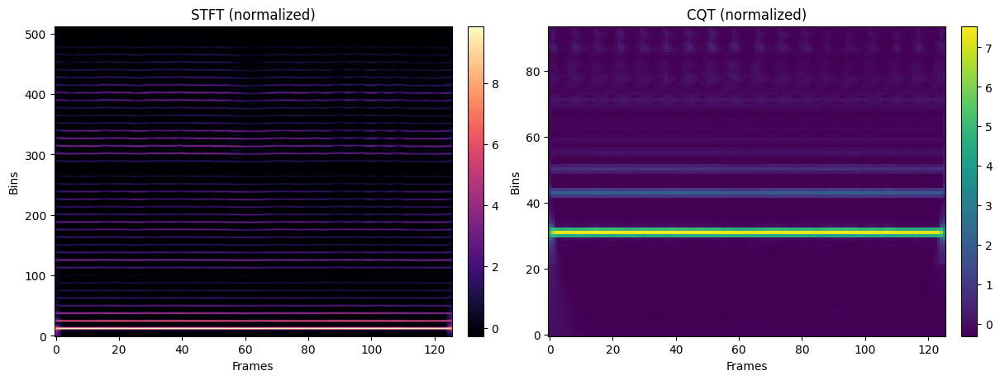

In [25]:
import random
import matplotlib.pyplot as plt
import numpy as np

# pick one random cached pair
stft_files = list((FEAT_DIR / "stft").glob("*.npy"))
assert len(stft_files) > 0, "No cached STFT features found."
sel = random.choice(stft_files)

S = np.load(sel)                                      # [F, T]
C = np.load(str((FEAT_DIR / "cqt" / (sel.stem + ".npy"))))  # [K, T]

# load stats
stats = np.load(STATS_NPZ)
S_norm = (S - float(stats["stft_mean"])) / float(stats["stft_std"])
C_norm = (C - float(stats["cqt_mean"]))  / float(stats["cqt_std"])

# Plot inline with clean layout (no overlaps)
fig, (ax1, ax2) = plt.subplots(
    1, 2, figsize=(12, 4.5), constrained_layout=True
)

im1 = ax1.imshow(S_norm, origin="lower", aspect="auto", cmap="magma")
ax1.set_title("STFT (normalized)")
ax1.set_xlabel("Frames"); ax1.set_ylabel("Bins")
cbar1 = fig.colorbar(im1, ax=ax1, fraction=0.046, pad=0.04)

im2 = ax2.imshow(C_norm, origin="lower", aspect="auto", cmap="viridis")
ax2.set_title("CQT (normalized)")
ax2.set_xlabel("Frames"); ax2.set_ylabel("Bins")
cbar2 = fig.colorbar(im2, ax=ax2, fraction=0.046, pad=0.04)

# if your matplotlib doesn't support constrained_layout well, also call:
# plt.tight_layout()

out_png = PLOT_DIR / f"normalized_preview_{sel.stem}.png"
fig.savefig(out_png, dpi=150, bbox_inches="tight")
print("Saved:", out_png)

plt.show()   # <-- ensure inline display


# 3.Polyphonic Synthesis & Separation Prior

### 3.1 Config & helpers

In [28]:
# Step 3 - Polyphonic Synthesis & Mask Prior
from pathlib import Path
import json, random, math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ------ Root paths (adjust if needed) ------
ROOT       = Path(r"D:\ELEC 5305 project\nsynth")         # <-- change if your root differs
INDEX_CSV  = ROOT / "index.csv"                           # already created in Step 1
FEAT_DIR   = ROOT / "features"                            # cached single-note STFT/CQT (Step 2)
MIX_DIR    = ROOT / "mixes"                               # <-- new output folder for Step 3
MIX_DIR.mkdir(parents=True, exist_ok=True)

STATS_NPZ  = ROOT / "feature_stats.npz"                   # global stats from Step 2
PLOT_DIR   = ROOT / "plots_features"                      # figures here
PLOT_DIR.mkdir(parents=True, exist_ok=True)

# ------ Audio / STFT / CQT params ------
SR          = 16000
SEG_SEC     = 2.0                  # 2-second clips
EPS         = 1e-8
MAX_SOURCES = (2, 3)               # randomly choose 2 or 3 sources for a mix
TARGET_RMS  = 0.08                 # target RMS for mixture, to prevent clipping
RNG_SEED    = 2025                 # reproducibility
random.seed(RNG_SEED)
np.random.seed(RNG_SEED)

# ------ Controls ------
SPLITS_TO_MIX   = ["train", "val"]  # we do NOT create mixes for 'test'
N_MIX_PER_SPLIT = 300               # <-- start small; you can increase later
N_SHOW_INLINE   = 3                 # show a few examples inline in notebook
SAVE_FIGS       = True              # also save figures to disk

# ---------- Fallback: safe loader if load_wav_mono is not defined ----------
try:
    load_wav_mono
except NameError:
    import soundfile as sf
    import librosa
    def load_wav_mono(wav_path, sr=SR):
        """Load a mono waveform, resampled to sr, duration SEG_SEC (pad/crop)."""
        x, in_sr = sf.read(str(wav_path), always_2d=False)
        if x.ndim > 1:
            x = np.mean(x, axis=1)
        if in_sr != sr:
            x = librosa.resample(x, orig_sr=in_sr, target_sr=sr)
        # pad/crop to SEG_SEC
        N = int(SEG_SEC * sr)
        if len(x) < N:
            x = np.pad(x, (0, N - len(x)))
        else:
            x = x[:N]
        return x.astype(np.float32)

# ---------- Utilities ----------
def rms(x: np.ndarray) -> float:
    return float(np.sqrt(np.mean(np.square(x) + 1e-12)))

def normalize_rms(x: np.ndarray, target_rms: float) -> np.ndarray:
    r = rms(x)
    if r < 1e-9:
        return np.zeros_like(x)
    return x * (target_rms / r)

def constrained_layout_or_tight(fig):
    """Ensure no overlap between titles/axes/colorbars."""
    try:
        fig.set_constrained_layout(True)
        fig.canvas.draw()
    except Exception:
        pass
    try:
        fig.tight_layout(pad=0.8)
    except Exception:
        pass

print("Step 3 config ready. MIX_DIR =", MIX_DIR)


Step 3 config ready. MIX_DIR = D:\ELEC 5305 project\nsynth\mixes


### 3.2 Core mixing & soft-mask truth

In [33]:
import librosa
import matplotlib.pyplot as plt
from pathlib import Path

# We will compute masks in STFT magnitude domain.
# M_k = |S_k| / (sum_j |S_j| + EPS)

def stft_mag(x: np.ndarray, n_fft=1024, hop_length=256, win="hann"):
    """Return STFT magnitude (not dB/log)."""
    S = librosa.stft(x, n_fft=n_fft, hop_length=hop_length, window=win, center=True)
    return np.abs(S).astype(np.float32)   # [F, T]

def mix_sources(rows, n_src):
    """Load n_src single-note waveforms, random-gain them, and produce a mixture.
       Return: x_mix, stems (list of waveforms), meta (instrument/family/path), per-stem STFT magnitudes."""
    sel = rows.sample(n=n_src, replace=False, random_state=np.random.randint(1, 10**9))
    stems = []
    meta  = []
    for _, r in sel.iterrows():
        x = load_wav_mono(r["path"], SR)
        stems.append(x)
        meta.append({
            "path":  r["path"],
            "inst":  r.get("instrument", "unknown"),
            "family": r.get("family", "unknown"),
            "pitch": r.get("pitch", None),
            "velocity": r.get("velocity", None),
        })

    # Random gains (Dirichlet-like): encourage non-trivial mixtures
    gains = np.random.uniform(0.5, 1.0, size=len(stems)).astype(np.float32)
    gains = gains / (np.sum(gains) + 1e-9)

    stems_g = [normalize_rms(s * g, TARGET_RMS * 0.9) for s, g in zip(stems, gains)]
    x_mix = np.sum(stems_g, axis=0).astype(np.float32)
    x_mix = normalize_rms(x_mix, TARGET_RMS)

    # Per-stem STFT magnitudes and mixture STFT
    Sks = [stft_mag(s) for s in stems_g]   # list of [F,T]
    # Align by min T just in case
    T_min = min(S.shape[1] for S in Sks)
    Sks = [S[:, :T_min] for S in Sks]
    S_sum = np.sum(np.stack(Sks, axis=0), axis=0)  # [F,T]

    # Soft masks [n_src, F, T]
    masks = []
    for Sk in Sks:
        Mk = Sk / (S_sum + EPS)
        masks.append(Mk.astype(np.float32))
    masks = np.stack(masks, axis=0)  # [n_src, F, T]

    return x_mix, stems_g, meta, Sks, masks


def compute_mix_features(x_mix: np.ndarray):
    """Compute mix STFT-logmag & CQT-logmag with your existing functions."""
    # If your project already defines stft_logmag / cqt_logmag, use them:
    S_log = stft_logmag(x_mix)   # [F, T]
    C_log = cqt_logmag(x_mix)    # [K, T]
    return S_log, C_log


def save_mix_npz(out_npz: Path, S_log, C_log, masks, meta):
    """Save all in one NPZ for compact I/O."""
    out_npz.parent.mkdir(parents=True, exist_ok=True)
    # Flatten meta (list of dict) to JSON string for portability
    meta_json = json.dumps(meta, ensure_ascii=False)
    np.savez_compressed(
        out_npz,
        stft=S_log.astype(np.float32),
        cqt=C_log.astype(np.float32),
        masks=masks.astype(np.float32),   # [n_src, F, T]
        meta_json=meta_json
    )


def plot_mix_and_masks(S_log, masks, title, out_png=None, show_inline=True):
    """
    Visualize mixture STFT and up to 2 soft masks with a wider layout.
    Robust against mpl layout bugs (no constrained_layout + no bbox_inches='tight').
    """
    n_src = masks.shape[0]
    show_src = min(2, n_src)

    # 1) DO NOT use constrained_layout to avoid zero-division bugs with colorbars
    fig = plt.figure(figsize=(16, 6), constrained_layout=False)
    width_ratios = [3] + [2] * show_src
    gs = fig.add_gridspec(
        1, 1 + show_src,
        width_ratios=width_ratios,
        wspace=0.15
    )

    # 2) Mixture
    ax0 = fig.add_subplot(gs[0, 0])
    im0 = ax0.imshow(S_log, origin="lower", aspect="auto", cmap="magma")
    ax0.set_title("Mixture STFT (log-magnitude)", fontsize=12)
    ax0.set_xlabel("Frames")
    ax0.set_ylabel("Bins")
    fig.colorbar(im0, ax=ax0, fraction=0.04, pad=0.02)  # keep fraction not too small

    # 3) Masks (up to 2)
    for i in range(show_src):
        axi = fig.add_subplot(gs[0, 1 + i])
        imi = axi.imshow(masks[i], origin="lower", aspect="auto",
                         cmap="viridis", vmin=0.0, vmax=1.0)
        axi.set_title(f"Soft mask M[{i}]", fontsize=12)
        axi.set_xlabel("Frames")
        axi.set_ylabel("Bins")
        fig.colorbar(imi, ax=axi, fraction=0.04, pad=0.02)

    # 4) Title + layout: use tight_layout + subplots_adjust (no constrained_layout)
    fig.suptitle(title, fontsize=14)
    plt.tight_layout(pad=0.8, rect=[0, 0, 1, 0.95])
    # 也可以细调：plt.subplots_adjust(top=0.88)

    # 5) Save WITHOUT bbox_inches='tight' (avoid mpl bug), use pad_inches instead
    if out_png is not None:
        out_png = Path(out_png)
        out_png.parent.mkdir(parents=True, exist_ok=True)
        fig.savefig(out_png, dpi=150, pad_inches=0.1)

    if show_inline:
        plt.show()
    else:
        plt.close(fig)




### 3.3 Generate mixes for train/val


=== Generating mixes for split: train ===


C:\Users\Eric\AppData\Local\Temp\ipykernel_58988\2778502512.py:114: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(pad=0.8, rect=[0, 0, 1, 0.95])


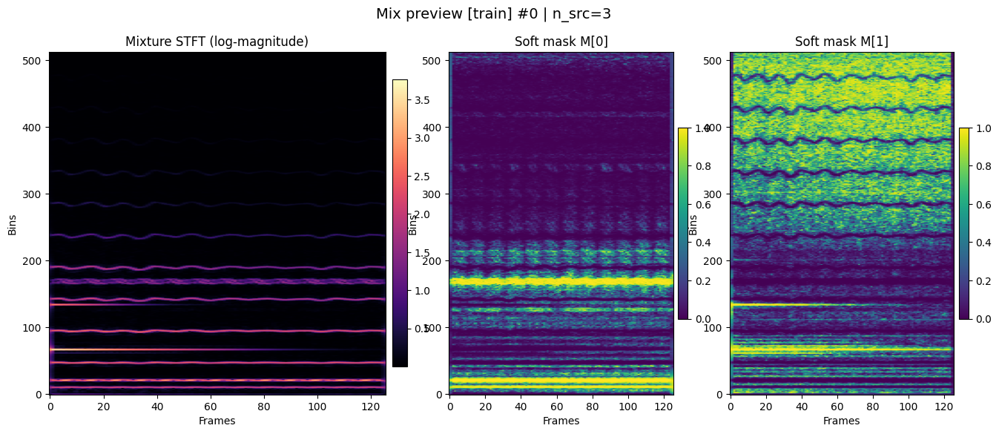

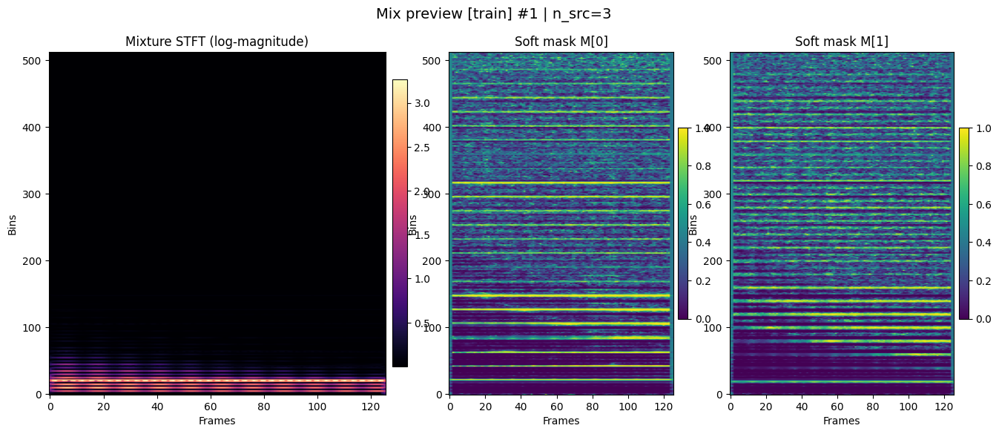

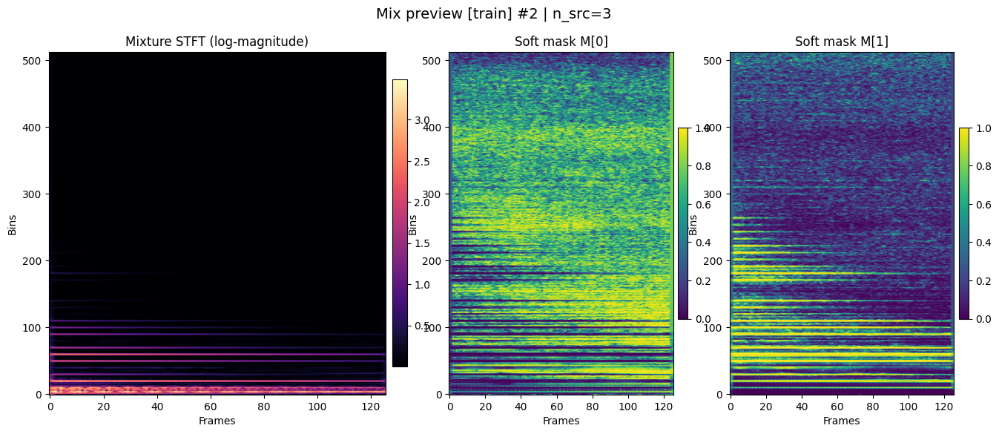


=== Generating mixes for split: val ===


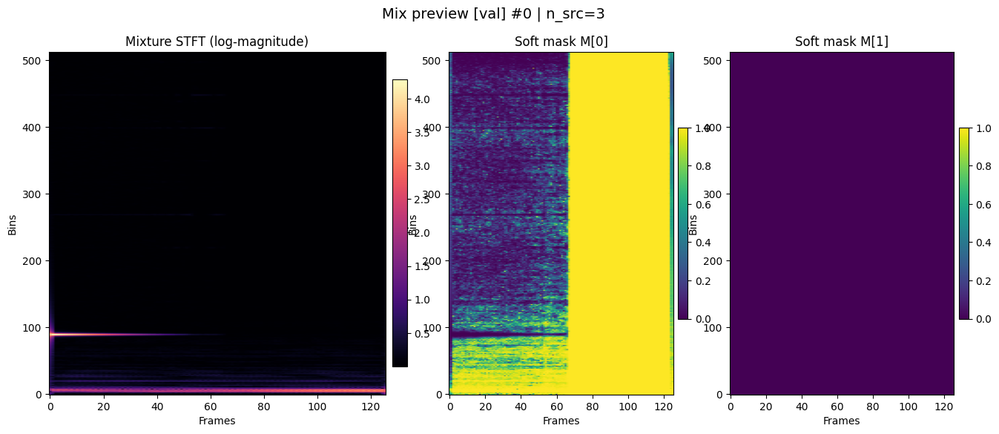

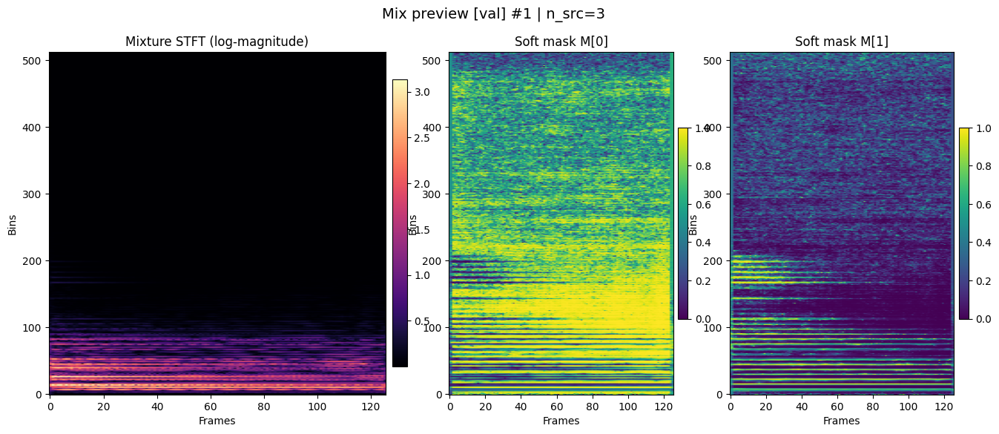

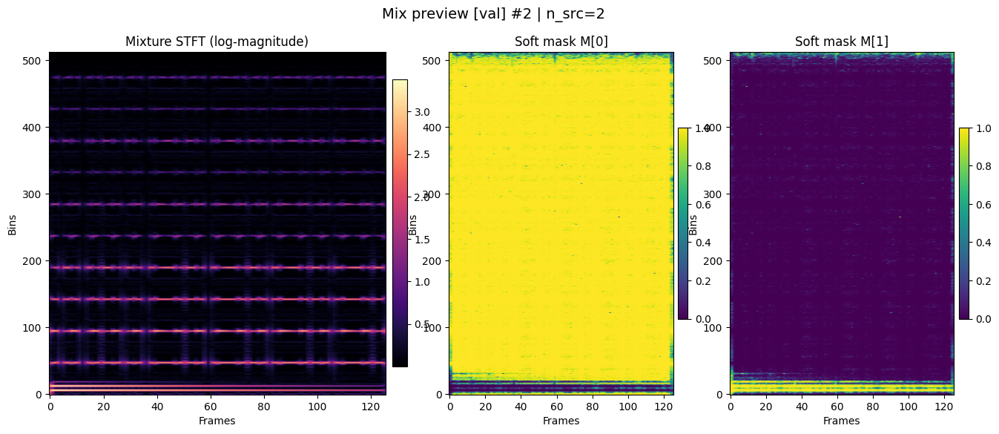


 Done. Created 600 mixes under D:\ELEC 5305 project\nsynth\mixes.


In [34]:
df = pd.read_csv(INDEX_CSV)
assert {"path","split"}.issubset(df.columns), "index.csv must at least have 'path' and 'split'."

made = 0
for split in SPLITS_TO_MIX:
    df_s = df[df["split"] == split]
    if df_s.empty:
        print(f"[{split}] no rows, skip.")
        continue

    print(f"\n=== Generating mixes for split: {split} ===")
    # we will create N_MIX_PER_SPLIT mixes; cap by dataset size to be safe
    n_to_make = min(N_MIX_PER_SPLIT, len(df_s))
    for i in range(n_to_make):
        n_src = random.choice(MAX_SOURCES)  # 2 or 3
        x_mix, stems_g, meta, Sks, masks = mix_sources(df_s, n_src=n_src)
        S_log, C_log = compute_mix_features(x_mix)

        # Save one NPZ per mixture
        out_npz = MIX_DIR / split / f"mix_{i:05d}.npz"
        save_mix_npz(out_npz, S_log, C_log, masks, meta)

        # Visualize a few
        if i < N_SHOW_INLINE:
            title = f"Mix preview [{split}] #{i} | n_src={n_src}"
            out_png = PLOT_DIR / "mix_previews" / f"{split}_mix_{i:05d}.png" if SAVE_FIGS else None
            plot_mix_and_masks(S_log, masks, title, out_png=out_png, show_inline=True)

        made += 1

print(f"\n Done. Created {made} mixes under {MIX_DIR}.")


Picked: mix_00250.npz
S_log: (513, 126) | C_log: (94, 126) | masks: (3, 513, 126)
Meta: [{'path': 'D:\\ELEC 5305 project\\nsynth\\processed_16k\\guitar_acoustic_015\\guitar_acoustic_015-061-050.wav', 'inst': 'guitar_acoustic_015', 'family': 'other', 'pitch': 61, 'velocity': 50}, {'path': 'D:\\ELEC 5305 project\\nsynth\\processed_16k\\guitar_acoustic_010\\guitar_acoustic_010-055-127.wav', 'inst': 'guitar_acoustic_010', 'family': 'other', 'pitch': 55, 'velocity': 127}, {'path': 'D:\\ELEC 5305 project\\nsynth\\processed_16k\\guitar_electronic_028\\guitar_electronic_028-094-075.wav', 'inst': 'guitar_electronic_028', 'family': 'other', 'pitch': 94, 'velocity': 75}]


C:\Users\Eric\AppData\Local\Temp\ipykernel_58988\2778502512.py:114: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(pad=0.8, rect=[0, 0, 1, 0.95])


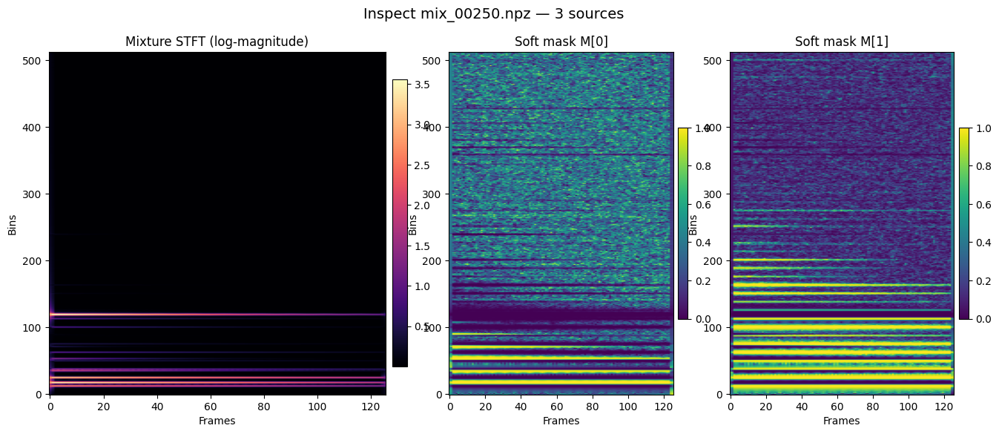

In [35]:
# Randomly inspect one saved mix
all_npz = list(MIX_DIR.rglob("*.npz"))
assert len(all_npz) > 0, "No mixes found. Run the previous cell first."
probe = random.choice(all_npz)

data = np.load(probe, allow_pickle=True)
S_log = data["stft"]      # [F,T]
C_log = data["cqt"]       # [K,T]  (not plotted here, but stored for training)
masks = data["masks"]     # [n_src,F,T]
meta  = json.loads(str(data["meta_json"]))

print("Picked:", probe.name)
print("S_log:", S_log.shape, "| C_log:", C_log.shape, "| masks:", masks.shape)
print("Meta:", meta)

# inline preview
title = f"Inspect {probe.name} — {len(meta)} sources"
out_png = PLOT_DIR / "mix_previews" / f"_inspect_{probe.stem}.png" if SAVE_FIGS else None
plot_mix_and_masks(S_log, masks, title, out_png=out_png, show_inline=True)


# 4 Target-Domain Degradations & Adaptation

### 4.1 Target-domain degradations

In [ ]:
# === Cell 4.1: Target-domain degradations (fresh) ===
import numpy as np, random, io, os, subprocess, json, tempfile
import soundfile as sf
from pathlib import Path
from scipy.signal import butter, lfilter

# ----------------  path/constant (change as needed) ----------------
ROOT      = Path(r"D:\ELEC 5305 project\nsynth")   # Data root directory
INDEX_CSV = ROOT / "index.csv"                    # The index derived from Step 2
SR        = 16000                                 # Sampling rate

def stft_logmag(x, sr=SR, n_fft=1024, hop=256):
    import librosa
    S = np.abs(librosa.stft(x, n_fft=n_fft, hop_length=hop)) + 1e-8
    return np.log(S)

def cqt_logmag(x, sr=SR, bpo=12, fmin=32.7, n_bins=84, hop=256):
    import librosa
    C = np.abs(librosa.cqt(x, sr=sr, hop_length=hop, fmin=fmin,
                           bins_per_octave=bpo, n_bins=n_bins)) + 1e-8
    return np.log(C)

def set_global_seed(seed=2025):
    random.seed(seed); np.random.seed(seed)

def butter_filter(x, sr, kind="low", cutoff=4000, order=4):
    nyq = 0.5 * sr
    Wn = np.clip(cutoff / nyq, 1e-4, 0.999)
    b, a = butter(order, Wn, btype=("low" if kind=="low" else "high"))
    return lfilter(b, a, x).astype(np.float32)

def compand_soft(x, in_knee=0.5, out_knee=0.8):
    # Lightweight amplification: Slightly boost the low level and slightly compress the high level
    x = np.tanh(x / max(in_knee, 1e-6)) * out_knee
    return x.astype(np.float32)

def make_small_ir(sr=SR, rt60=0.45, length=0.7):
    n = int(length*sr)
    t = np.arange(n)/sr
    ir = np.exp(-6.9*t/max(rt60,1e-3))
    ir *= np.linspace(1, 0.85, n)                    # The high-frequency drop is just a little bit
    ir += np.random.randn(n)*1e-3                    # Slight noise
    ir = ir/ (np.max(np.abs(ir))+1e-8)
    return ir.astype(np.float32)

def convolve_trim(x, h):
    y = np.convolve(x, h, mode="full")[:len(x)]
    return y.astype(np.float32)

def add_noise(x, snr_db=25):
    p = np.mean(x**2) + 1e-12
    nvar = p / (10**(snr_db/10.0))
    n = np.random.randn(*x.shape)*np.sqrt(nvar)
    return (x+n).astype(np.float32)

def mp3_or_mulaw_like(x, sr=SR, kbps=32):
    """Give priority to ffmpeg mp3 with low bit rate; When there is no ffmpeg, it degenerates into the μ-law+ low-pass approximation."""
    try:
        # Write a temporary wav → Compress it into an mp3 by ffmpeg → read it back
        with tempfile.TemporaryDirectory() as td:
            w = Path(td)/"a.wav"
            m = Path(td)/"a.mp3"
            sf.write(w.as_posix(), x, sr, subtype="PCM_16")
            cmd = ["ffmpeg","-loglevel","error","-y",
                   "-i", w.as_posix(), "-acodec", "libmp3lame",
                   "-b:a", f"{kbps}k", m.as_posix()]
            subprocess.run(cmd, check=True)
            y, _sr = sf.read(m.as_posix(), dtype="float32")
            if _sr != sr:
                import librosa
                y = librosa.resample(y, orig_sr=_sr, target_sr=sr)
            return y.astype(np.float32)
    except Exception:
        # μ-law approximation + low pass
        mu = 255.0
        s  = np.sign(x) * np.log1p(mu*np.abs(x))/np.log1p(mu)
        y  = butter_filter(s, sr, "low", cutoff=4000, order=6)
        return y.astype(np.float32)

# ----------------  The intensity of the preset  ----------------
PRESET = {
    "A": {  
        "rt60":   (0.25, 0.40),
        "rv_mix": (0.15, 0.30),
        "rv_len": (0.50, 0.70),
        "eq":     {"type_p":0.5, "lp":(4500,7500), "hp":(60,140), "mix":(0.15,0.30)},
        "comp":   (0.50, 0.80),
        "snr":    (25, 35),
        "kbps":   (40, 48),
    },
    "B": {  
        "rt60":   (0.35, 0.60),
        "rv_mix": (0.25, 0.45),
        "rv_len": (0.60, 0.90),
        "eq":     {"type_p":0.5, "lp":(3000,6000), "hp":(120,240), "mix":(0.25,0.45)},
        "comp":   (0.45, 0.75),
        "snr":    (18, 28),
        "kbps":   (28, 40),
    },
    "C": {  
        "rt60":   (0.45, 0.80),
        "rv_mix": (0.35, 0.55),
        "rv_len": (0.70, 1.10),
        "eq":     {"type_p":0.5, "lp":(2200,4500), "hp":(160,320), "mix":(0.35,0.55)},
        "comp":   (0.40, 0.70),
        "snr":    (12, 22),
        "kbps":   (24, 32),
    }
}

def apply_reverb(x, sr, cfg):
    rt60 = random.uniform(*cfg["rt60"])
    rlen = random.uniform(*cfg["rv_len"])
    mix  = random.uniform(*cfg["rv_mix"])
    ir   = make_small_ir(sr, rt60, rlen)
    wet  = convolve_trim(x, ir)
    y    = (1-mix)*x + mix*wet
    return y.astype(np.float32), {"rt60":rt60, "len":rlen, "mix":mix}

def apply_eq(x, sr, cfg):
    do_low = (random.random() < cfg["type_p"])
    if do_low:
        cut = random.uniform(*cfg["lp"])
        y   = butter_filter(x, sr, "low", cutoff=cut, order=4)
        typ = "lowpass"
    else:
        cut = random.uniform(*cfg["hp"])
        y   = butter_filter(x, sr, "high", cutoff=cut, order=4)
        typ = "highpass"
    mix = random.uniform(*cfg["mix"])
    z = (1-mix)*x + mix*y
    return z.astype(np.float32), {"type":typ, "cutoff":cut, "mix":mix}

def normalize_peak(x, peak=0.98):
    m = np.max(np.abs(x))+1e-8
    return (x/m*peak).astype(np.float32)

def augment_chain(x, sr=SR, strength="B", order=None):
    """
    Degradation process:
      Reverb → EQ → Amplification → MP3/μ-law → Noise addition → Peak normalization
    The order of operators can be customized through Order (for example, ["reverb","noise",...] 
    """
    cfg = PRESET[strength]
    log = {"strength": strength}

    seq = order or ["reverb","eq","compand","codec","noise"]
    y = x.astype(np.float32).copy()
    for op in seq:
        if op == "reverb":
            y, p = apply_reverb(y, sr, cfg); log["reverb"]=p
        elif op == "eq":
            y, p = apply_eq(y, sr, cfg["eq"]); log["eq"]=p
        elif op == "compand":
            knee_in  = random.uniform(*cfg["comp"])
            knee_out = random.uniform(0.75, 0.95)
            y = compand_soft(y, knee_in, knee_out)
            log["compand"] = {"in":knee_in, "out":knee_out}
        elif op == "codec":
            kbps = int(random.uniform(*cfg["kbps"]))
            y = mp3_or_mulaw_like(y, sr, kbps=kbps)
            log["codec"] = {"kbps":kbps}
        elif op == "noise":
            snr = random.uniform(*cfg["snr"])
            y = add_noise(y, snr_db=snr)
            log["noise"] = {"snr_db":snr}

    y = normalize_peak(y, 0.98)
    return y, log


### 4.2 Batch build target-domain set & cache features

In [42]:
# === Cell 4.2: Batch build target-domain set & cache features ===
import pandas as pd
from tqdm import tqdm

# Output directory
TARGET_WAV_DIR  = ROOT / "target_wav"           # Target domain audio
TARGET_FEAT_DIR = ROOT / "target_feats"         # Target domain features
TARGET_CSV      = ROOT / "target_manifest.csv"  # List of target domains

TARGET_WAV_DIR.mkdir(parents=True, exist_ok=True)
(TARGET_FEAT_DIR/"stft").mkdir(parents=True, exist_ok=True)
(TARGET_FEAT_DIR/"cqt").mkdir(parents=True, exist_ok=True)

# Intensity and randomness
STRENGTH = "B"     #  "A" / "B" / "C"
SEED     = 2025
set_global_seed(SEED)

df = pd.read_csv(INDEX_CSV)
rows = []

for _, r in tqdm(df.iterrows(), total=len(df), desc=f"Build target ({STRENGTH})"):
    wav_path = Path(r["path"])
    if not wav_path.exists():
        continue

    x, sr = sf.read(wav_path.as_posix(), dtype="float32")
    if x.ndim > 1:
        x = x.mean(axis=1).astype(np.float32)
    if sr != SR:
        import librosa
        x = librosa.resample(x, orig_sr=sr, target_sr=SR)
        sr = SR

    y, log = augment_chain(x, sr=SR, strength=STRENGTH)

    # Save the audio of the target domain
    out_wav = TARGET_WAV_DIR / (wav_path.stem + "_tgt.wav")
    sf.write(out_wav.as_posix(), y, SR, subtype="PCM_16")

    # Cache the features of the target domain
    S = stft_logmag(y, SR)     # [F,T]
    C = cqt_logmag(y, SR)      # [K,T]
    np.save((TARGET_FEAT_DIR/"stft"/(wav_path.stem + ".npy")).as_posix(), S)
    np.save((TARGET_FEAT_DIR/"cqt" /(wav_path.stem + ".npy")).as_posix(), C)

    rows.append({
        "orig_path": wav_path.as_posix(),
        "target_wav": out_wav.as_posix(),
        "stft_tgt": (TARGET_FEAT_DIR/"stft"/(wav_path.stem + ".npy")).as_posix(),
        "cqt_tgt":  (TARGET_FEAT_DIR/"cqt" /(wav_path.stem + ".npy")).as_posix(),
        "split": r.get("split","unknown"),
        "instrument": r.get("instrument","unknown"),
        "family": r.get("family","unknown"),
        "log": json.dumps(log, ensure_ascii=False)
    })

pd.DataFrame(rows).to_csv(TARGET_CSV, index=False)
print("Done. Manifest ->", TARGET_CSV)
print("stft files:", len(list((TARGET_FEAT_DIR/'stft').glob('*.npy'))),
      "| cqt files:", len(list((TARGET_FEAT_DIR/'cqt').glob('*.npy'))))


Build target (B): 100%|██████████| 16774/16774 [17:10<00:00, 16.28it/s]


Done. Manifest -> D:\ELEC 5305 project\nsynth\target_manifest.csv
stft files: 16774 | cqt files: 16774


### 4.3 Visualization

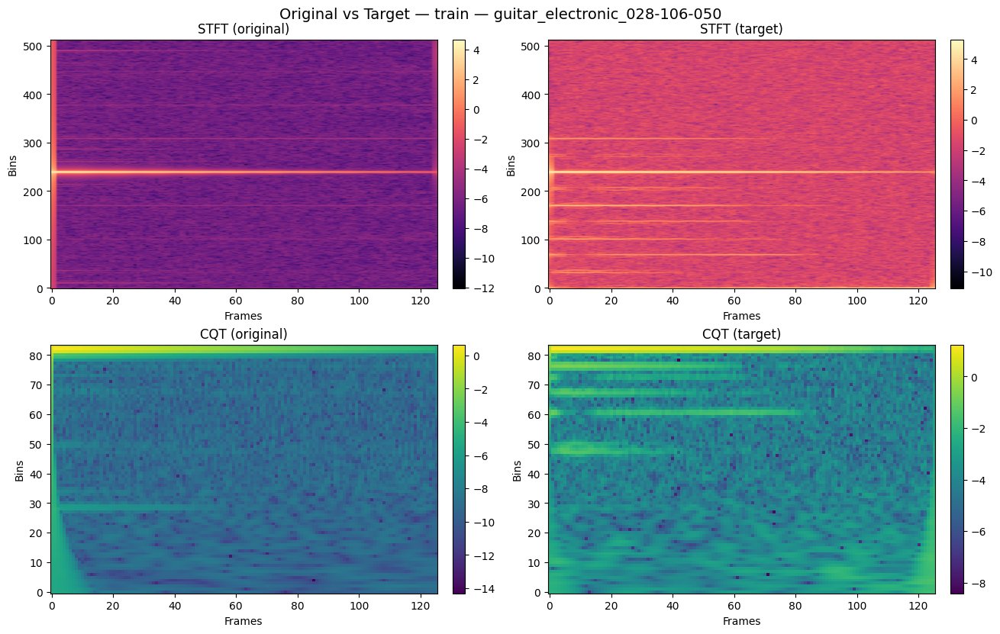

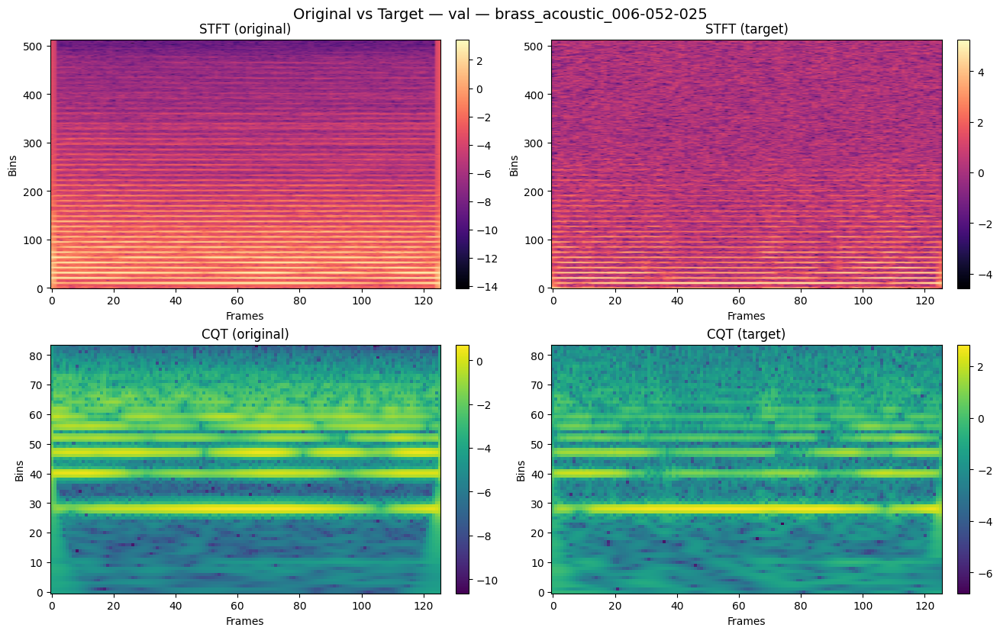

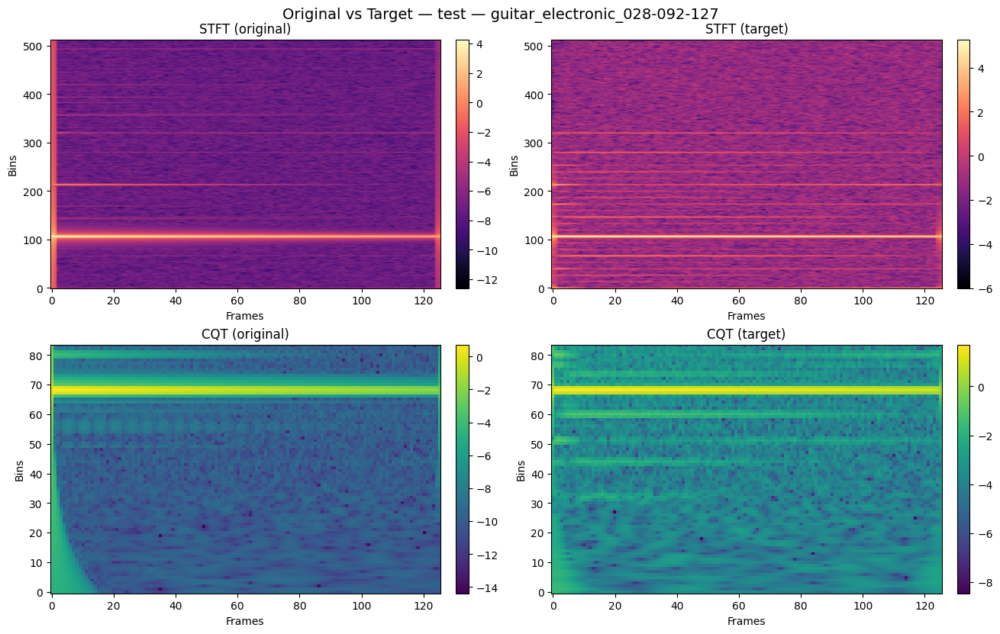

In [43]:
# === Cell 4.3: Visualization (side-by-side) ===
import matplotlib.pyplot as plt
import pandas as pd

def show_compare(orig_wav: Path, tgt_wav: Path, title: str=""):
    xo, _ = sf.read(orig_wav.as_posix(), dtype="float32")
    xt, _ = sf.read(tgt_wav.as_posix(), dtype="float32")
    if xo.ndim>1: xo = xo.mean(axis=1)
    if xt.ndim>1: xt = xt.mean(axis=1)

    So = stft_logmag(xo, SR); Co = cqt_logmag(xo, SR)
    St = stft_logmag(xt, SR); Ct = cqt_logmag(xt, SR)

    fig, axes = plt.subplots(2, 2, figsize=(13, 8), constrained_layout=True)
    ax = axes[0,0]
    im = ax.imshow(So, origin="lower", aspect="auto", cmap="magma")
    ax.set_title("STFT (original)"); ax.set_xlabel("Frames"); ax.set_ylabel("Bins")
    fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)

    ax = axes[0,1]
    im = ax.imshow(St, origin="lower", aspect="auto", cmap="magma")
    ax.set_title("STFT (target)"); ax.set_xlabel("Frames"); ax.set_ylabel("Bins")
    fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)

    ax = axes[1,0]
    im = ax.imshow(Co, origin="lower", aspect="auto", cmap="viridis")
    ax.set_title("CQT (original)"); ax.set_xlabel("Frames"); ax.set_ylabel("Bins")
    fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)

    ax = axes[1,1]
    im = ax.imshow(Ct, origin="lower", aspect="auto", cmap="viridis")
    ax.set_title("CQT (target)"); ax.set_xlabel("Frames"); ax.set_ylabel("Bins")
    fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)

    if title:
        fig.suptitle(title, fontsize=14, y=1.02)
    plt.show()

# Sampling preview (Select one from train/val/test)
import pandas as pd
t = pd.read_csv(TARGET_CSV)
for sp in ["train","val","test"]:
    sub = t[t["split"]==sp]
    if len(sub)==0: continue
    row = sub.sample(1, random_state=2025).iloc[0]
    show_compare(Path(row["orig_path"]), Path(row["target_wav"]),
                 title=f"Original vs Target — {sp} — {Path(row['orig_path']).stem}")


# 5 Self-Supervised Pretraining

In [ ]:
# -*- coding: utf-8 -*-
# Step-5 Visualization (paths fixed to your layout)

from pathlib import Path
import random, json, math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ---------- Your project root & caches ----------
ROOT       = Path(r"D:\ELEC 5305 project\nsynth")
FEAT_DIR   = ROOT / "features_stft_cqt"      # <— your cache folder
STFT_DIR   = FEAT_DIR / "stft"
CQT_DIR    = FEAT_DIR / "cqt"
INDEX_CSV  = ROOT / "index.csv"              # exported earlier in Step-1/2
STATS_NPZ  = ROOT / "feature_stats.npz"      # saved earlier (your screenshot)
VIZ_DIR    = ROOT / "viz_step5"
VIZ_DIR.mkdir(exist_ok=True)

# ---------- Sanity checks ----------
assert STFT_DIR.exists() and CQT_DIR.exists(), \
    f"stft/cqt cache not found under {FEAT_DIR}"
if not INDEX_CSV.exists():
    print("⚠ index.csv not found – histogram by split will be skipped.")
else:
    print("✓ Found index.csv")

if not STATS_NPZ.exists():
    print("⚠ feature_stats.npz not found – figures will use raw magnitudes.")
else:
    print("✓ Found feature_stats.npz")

print("Figures will be saved to:", VIZ_DIR)

# ---------- Stats loader ----------
STFT_MEAN = STFT_STD = CQT_MEAN = CQT_STD = None
if STATS_NPZ.exists():
    stats = np.load(STATS_NPZ)
    STFT_MEAN = float(stats["stft_mean"])
    STFT_STD  = float(stats["stft_std"])
    CQT_MEAN  = float(stats["cqt_mean"])
    CQT_STD   = float(stats["cqt_std"])

def norm_if_stats(arr: np.ndarray, kind: str) -> np.ndarray:
    """Normalize STFT/CQT with global stats if available."""
    if kind == "stft" and STFT_MEAN is not None:
        return (arr - STFT_MEAN) / max(STFT_STD, 1e-12)
    if kind == "cqt" and CQT_MEAN is not None:
        return (arr - CQT_MEAN) / max(CQT_STD, 1e-12)
    return arr

# ---------- I/O helpers ----------
def load_pair_from_stem(stem: str):
    """
    Load cached STFT & CQT .npy by stem name (file without extension).
    Returns (S, C) with shape [F,T] and [K,T].
    """
    s_path = STFT_DIR / f"{stem}.npy"
    c_path = CQT_DIR  / f"{stem}.npy"
    if not s_path.exists() or not c_path.exists():
        raise FileNotFoundError(f"Cached pair missing for stem={stem}")
    S = np.load(s_path)
    C = np.load(c_path)
    return S, C

def pick_random_stems(n=3, split="train"):
    """
    Pick n random stems that exist in both STFT and CQT caches.
    If index.csv is present, we filter by split; otherwise sample from disk.
    """
    stems = []
    if INDEX_CSV.exists():
        df = pd.read_csv(INDEX_CSV)
        cand = df[df["split"]==split].copy()
        # stem is filename without extension
        cand["stem"] = cand["path"].apply(lambda p: Path(p).stem)
        for st in cand["stem"].tolist():
            if (STFT_DIR/f"{st}.npy").exists() and (CQT_DIR/f"{st}.npy").exists():
                stems.append(st)
    else:
        # fallback: intersect stems by folder listing
        stft_stems = {p.stem for p in STFT_DIR.glob("*.npy")}
        cqt_stems  = {p.stem for p in CQT_DIR.glob("*.npy")}
        stems = list(stft_stems & cqt_stems)

    if len(stems) == 0:
        raise RuntimeError("No cached pairs found for the requested split.")
    random.seed(2025)
    n = min(n, len(stems))
    return random.sample(stems, n)


✓ Found index.csv
✓ Found feature_stats.npz
Figures will be saved to: D:\ELEC 5305 project\nsynth\viz_step5


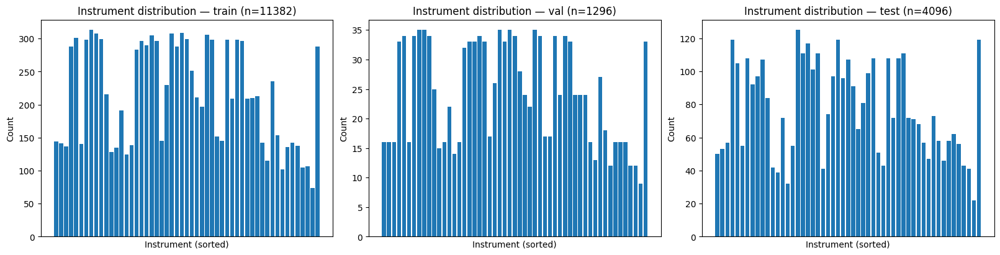

Saved: D:\ELEC 5305 project\nsynth\viz_step5\label_histogram_by_split.png


In [48]:
if INDEX_CSV.exists():
    df = pd.read_csv(INDEX_CSV)
    fig, axes = plt.subplots(1, 3, figsize=(16, 4), constrained_layout=True)
    for ax, sp in zip(axes, ["train", "val", "test"]):
        sub = df[df["split"]==sp]
        counts = sub["instrument"].value_counts().sort_index()
        ax.bar(np.arange(len(counts)), counts.values)
        ax.set_title(f"Instrument distribution — {sp} (n={len(sub)})")
        ax.set_xlabel("Instrument (sorted)")
        ax.set_ylabel("Count")
        ax.set_xticks([])

    out = VIZ_DIR / "label_histogram_by_split.png"
    fig.savefig(out, dpi=150, bbox_inches="tight")
    plt.show()
    print("Saved:", out)
else:
    print("Skipping histogram – index.csv is missing.")


In [53]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.signal as sig
import scipy.ndimage as ndi

def _robust_limits(X, low=1, high=99):
    """Robust color limits by percentiles to avoid outliers dominating."""
    return np.percentile(X, low), np.percentile(X, high)

def enhance_target_like(x2d: np.ndarray, mode="denoise", strength=1.0, seed=2025):
    """
    Stronger 'target-domain' enhancement on magnitude maps.
    strength: 0.2 (subtle) ~ 2.0 (aggressive)
    modes:
      - 'denoise'   : subtract median baseline along freq + soft floor
      - 'eq_tilt'   : low-shelf boost & high-shelf cut (tilt by freq)
      - 'soft_comp' : push magnitudes toward mean (soft compression)
      - 'blur_time' : temporal Gaussian blur (simulates smear/codec)
      - 'reverb'    : exponential decay along time (very light room IR)
      - 'bandpass'  : mild band-pass emphasis (low/high attenuation)
    """
    rng = np.random.default_rng(seed)
    X = x2d.astype(np.float32).copy()

    if mode == "denoise":
        baseline = np.median(X, axis=1, keepdims=True)
        X = np.clip(X - (0.25 * strength) * baseline, a_min=0, a_max=None)

    elif mode == "eq_tilt":
        # Tilt curve from + to − across frequency axis
        F = X.shape[0]
        tilt = np.linspace(1.0 + 0.5*strength, 1.0 - 0.5*strength, F, dtype=np.float32)[:, None]
        X *= tilt

    elif mode == "soft_comp":
        mu = X.mean()
        ratio = np.clip(1.0 - 0.35*strength, 0.1, 1.0)  # smaller => stronger compression
        X = mu + ratio * (X - mu)

    elif mode == "blur_time":
        sigma_t = 0.5 + 1.2*strength   # temporal blur
        X = ndi.gaussian_filter(X, sigma=(0.0, sigma_t))

    elif mode == "reverb":
        # Simple exponential decay FIR along time axis
        T = X.shape[1]
        decay = 0.85 - 0.25*np.tanh(0.7*strength)       # 0.6~0.85
        k = min(T//6, 80)                               # kernel length
        h = decay ** np.arange(k, dtype=np.float32)
        h /= h.sum()
        X = sig.convolve2d(X, np.reshape(h, (1, -1)), mode="same", boundary="symm")

    elif mode == "bandpass":
        # gentle low/high shaping across frequency axis
        F = X.shape[0]
        f = np.linspace(0, 1, F, dtype=np.float32)
        bp = np.exp(-((f-0.35)**2)/(2*(0.18/strength)**2))  # bell @ 0.35
        bp = 0.6 + 0.8*bp                                   # 0.6~1.4
        X *= bp[:, None]

    else:
        pass  # no-op

    return X

def show_original_vs_target(stem: str, mode="eq_tilt", strength=1.4, add_diff=True):
    """
    Show STFT/CQT original vs target-like with robust color scaling and difference maps.
    """
    S, C = load_pair_from_stem(stem)
    S2 = enhance_target_like(S, mode=mode, strength=strength)
    C2 = enhance_target_like(C, mode=mode, strength=strength)

    # Robust color limits (fix per-pair so panels are comparable)
    s_vmin, s_vmax = _robust_limits(S)
    c_vmin, c_vmax = _robust_limits(C)

    if add_diff:
        fig, axs = plt.subplots(2, 3, figsize=(14, 7), constrained_layout=True)
        # STFT: original / target / diff
        im = axs[0,0].imshow(S,  origin="lower", aspect="auto", cmap="magma",
                             vmin=s_vmin, vmax=s_vmax)
        axs[0,0].set_title("STFT (original)")
        fig.colorbar(im, ax=axs[0,0], fraction=0.046, pad=0.04)

        im = axs[0,1].imshow(S2, origin="lower", aspect="auto", cmap="magma",
                             vmin=s_vmin, vmax=s_vmax)
        axs[0,1].set_title("STFT (target-like)")
        fig.colorbar(im, ax=axs[0,1], fraction=0.046, pad=0.04)

        Sd = S2 - S
        dlim = np.max(np.abs(np.percentile(Sd, [1, 99])))
        im = axs[0,2].imshow(Sd, origin="lower", aspect="auto", cmap="coolwarm",
                             vmin=-dlim, vmax= dlim)
        axs[0,2].set_title("STFT Δ (target − original)")
        fig.colorbar(im, ax=axs[0,2], fraction=0.046, pad=0.04)

        # CQT: original / target / diff
        im = axs[1,0].imshow(C,  origin="lower", aspect="auto", cmap="viridis",
                             vmin=c_vmin, vmax=c_vmax)
        axs[1,0].set_title("CQT (original)")
        fig.colorbar(im, ax=axs[1,0], fraction=0.046, pad=0.04)

        im = axs[1,1].imshow(C2, origin="lower", aspect="auto", cmap="viridis",
                             vmin=c_vmin, vmax=c_vmax)
        axs[1,1].set_title("CQT (target-like)")
        fig.colorbar(im, ax=axs[1,1], fraction=0.046, pad=0.04)

        Cd = C2 - C
        dlim = np.max(np.abs(np.percentile(Cd, [1, 99])))
        im = axs[1,2].imshow(Cd, origin="lower", aspect="auto", cmap="coolwarm",
                             vmin=-dlim, vmax= dlim)
        axs[1,2].set_title("CQT Δ (target − original)")
        fig.colorbar(im, ax=axs[1,2], fraction=0.046, pad=0.04)

        for ax in axs.ravel():
            ax.set_xlabel("Frames"); ax.set_ylabel("Bins")

    else:
        fig, axs = plt.subplots(2, 2, figsize=(12, 7), constrained_layout=True)
        im = axs[0,0].imshow(S,  origin="lower", aspect="auto", cmap="magma",
                             vmin=s_vmin, vmax=s_vmax)
        axs[0,0].set_title("STFT (original)")
        fig.colorbar(im, ax=axs[0,0], fraction=0.046, pad=0.04)

        im = axs[0,1].imshow(S2, origin="lower", aspect="auto", cmap="magma",
                             vmin=s_vmin, vmax=s_vmax)
        axs[0,1].set_title("STFT (target-like)")
        fig.colorbar(im, ax=axs[0,1], fraction=0.046, pad=0.04)

        im = axs[1,0].imshow(C,  origin="lower", aspect="auto", cmap="viridis",
                             vmin=c_vmin, vmax=c_vmax)
        axs[1,0].set_title("CQT (original)")
        fig.colorbar(im, ax=axs[1,0], fraction=0.046, pad=0.04)

        im = axs[1,1].imshow(C2, origin="lower", aspect="auto", cmap="viridis",
                             vmin=c_vmin, vmax=c_vmax)
        axs[1,1].set_title("CQT (target-like)")
        fig.colorbar(im, ax=axs[1,1], fraction=0.046, pad=0.04)

        for ax in axs.ravel():
            ax.set_xlabel("Frames"); ax.set_ylabel("Bins")

    out = VIZ_DIR / f"orig_vs_target_{stem}_{mode}_s{strength:.1f}.png"
    fig.suptitle(f"Original vs Target-like — {stem} | mode={mode}, strength={strength}",
                 y=1.02, fontsize=12)
    fig.savefig(out, dpi=150, bbox_inches="tight")
    plt.show()
    print("Saved:", out)


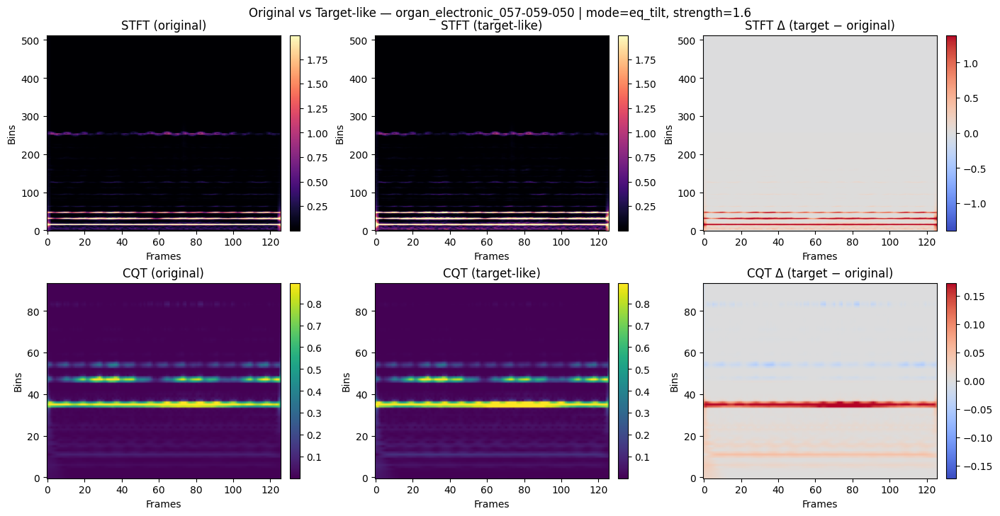

Saved: D:\ELEC 5305 project\nsynth\viz_step5\orig_vs_target_organ_electronic_057-059-050_eq_tilt_s1.6.png


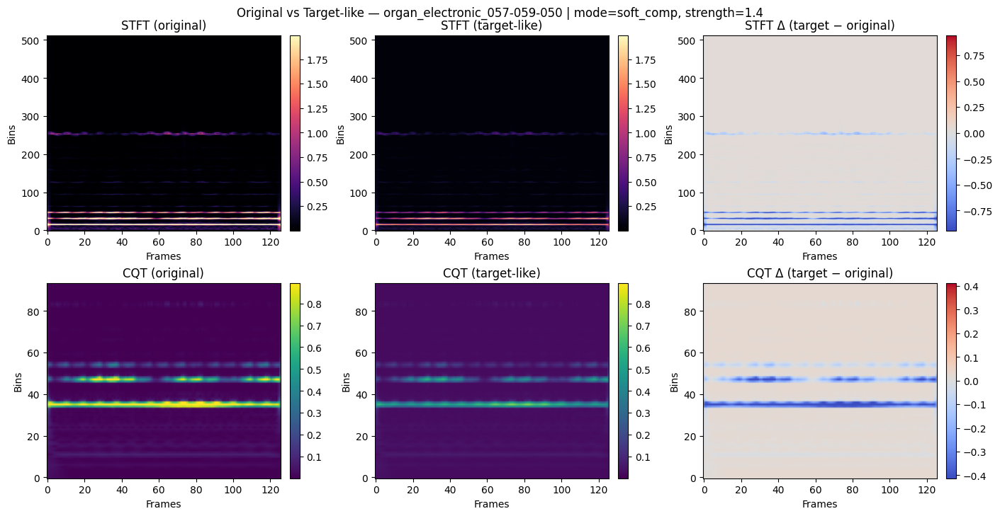

Saved: D:\ELEC 5305 project\nsynth\viz_step5\orig_vs_target_organ_electronic_057-059-050_soft_comp_s1.4.png


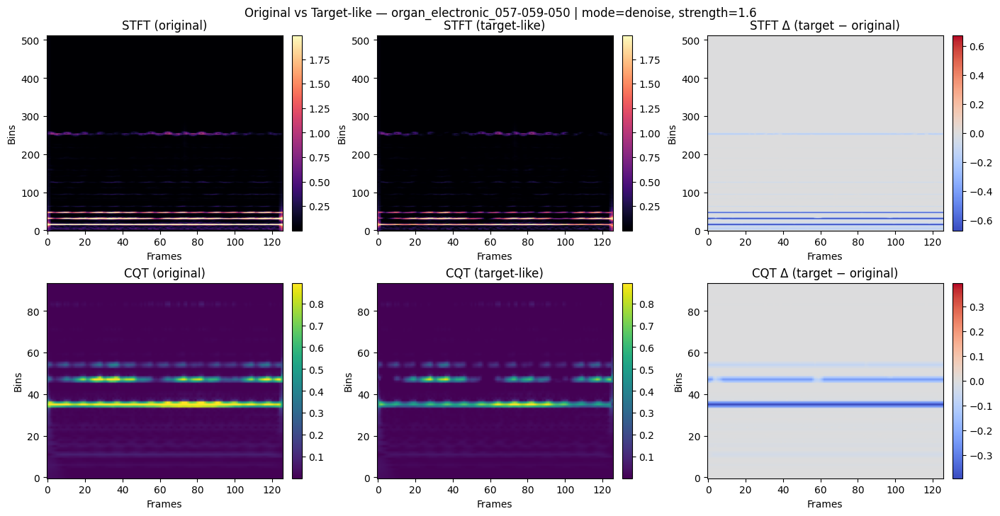

Saved: D:\ELEC 5305 project\nsynth\viz_step5\orig_vs_target_organ_electronic_057-059-050_denoise_s1.6.png


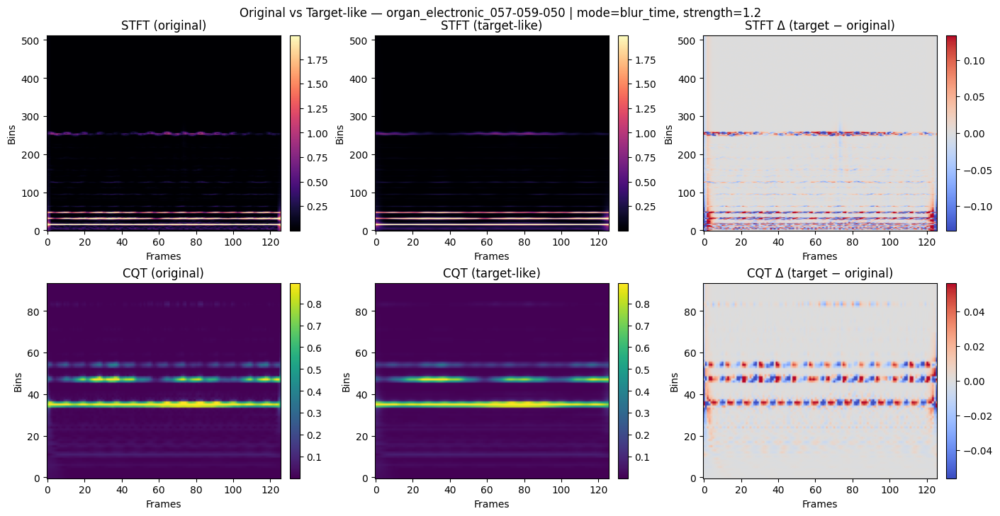

Saved: D:\ELEC 5305 project\nsynth\viz_step5\orig_vs_target_organ_electronic_057-059-050_blur_time_s1.2.png


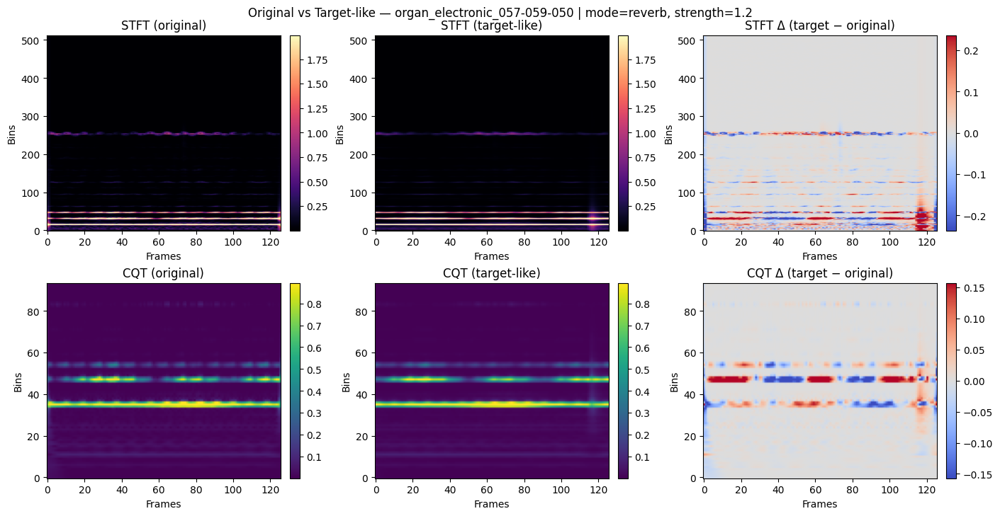

Saved: D:\ELEC 5305 project\nsynth\viz_step5\orig_vs_target_organ_electronic_057-059-050_reverb_s1.2.png


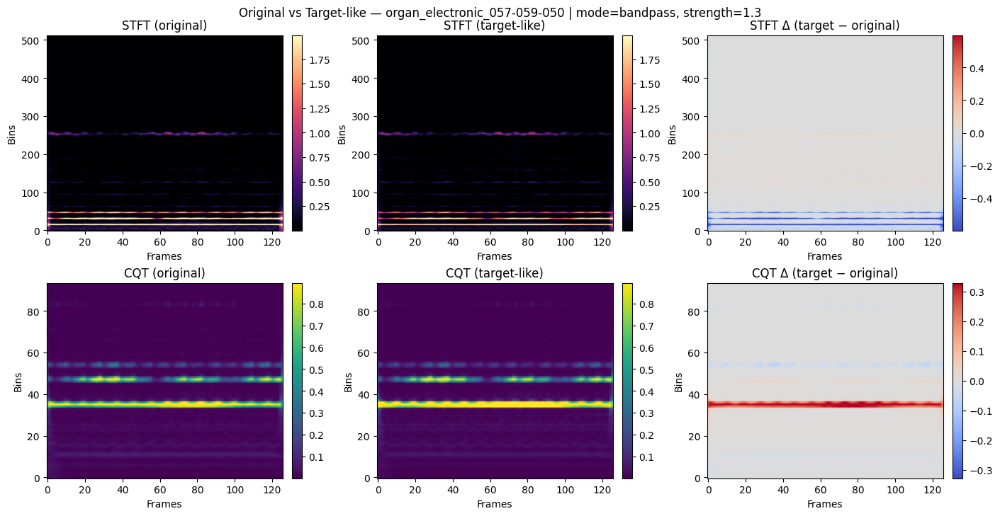

Saved: D:\ELEC 5305 project\nsynth\viz_step5\orig_vs_target_organ_electronic_057-059-050_bandpass_s1.3.png


In [ ]:
st = pick_random_stems(n=1, split="train")[0]

# 1) EQ tilt (the most intuitive difference)
show_original_vs_target(st, mode="eq_tilt", strength=1.6, add_diff=True)

# 2) Soft compression (overall "extrusion" dynamics)
show_original_vs_target(st, mode="soft_comp", strength=1.4, add_diff=True)

# 3) Denoising (subtract the median baseline of the frequency direction）
show_original_vs_target(st, mode="denoise", strength=1.6, add_diff=True)

# 4) Time blur/codec sense (diffusion + smoothness)
show_original_vs_target(st, mode="blur_time", strength=1.2, add_diff=True)

# 5) Faint reverberation (exponentially decaying convolution）
show_original_vs_target(st, mode="reverb", strength=1.2, add_diff=True)

# 6) band-pass emphasis
show_original_vs_target(st, mode="bandpass", strength=1.3, add_diff=True)


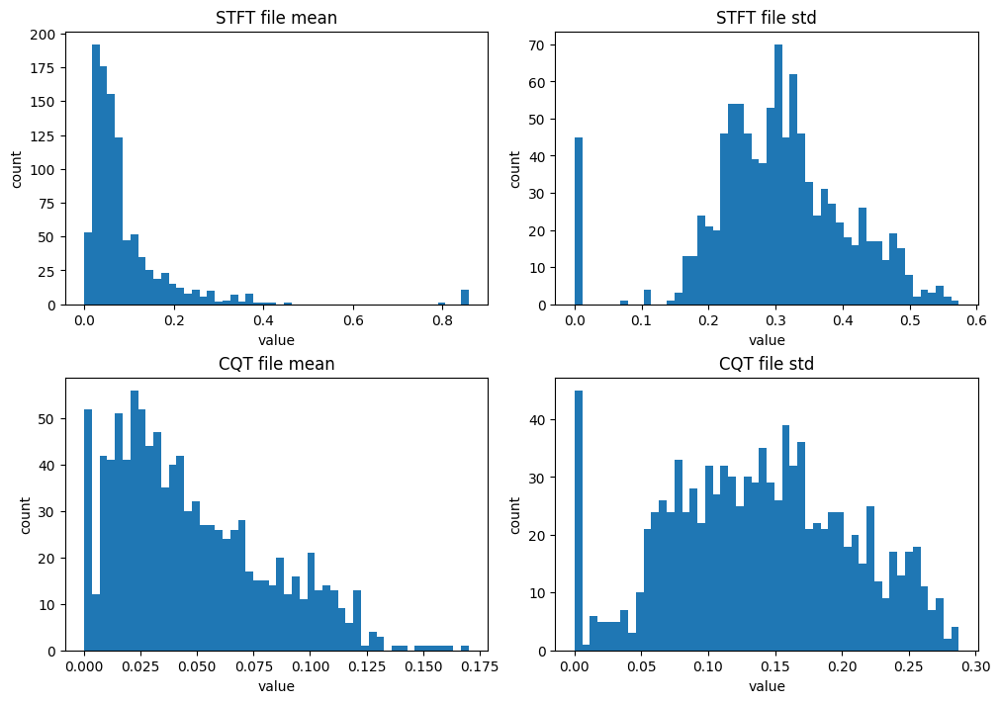

Saved: D:\ELEC 5305 project\nsynth\viz_step5\file_mean_std_hist.png


In [51]:
# Estimate per-file mean/std and plot histograms (quick data sanity)
def collect_file_stats(dir_path: Path, max_files=500):
    files = list(dir_path.glob("*.npy"))
    random.seed(2025)
    files = random.sample(files, min(max_files, len(files)))
    means, stds = [], []
    for p in files:
        X = np.load(p)
        means.append(float(X.mean()))
        stds.append(float(X.std()))
    return np.array(means), np.array(stds)

stft_means, stft_stds = collect_file_stats(STFT_DIR, max_files=1000)
cqt_means,  cqt_stds  = collect_file_stats(CQT_DIR,  max_files=1000)

fig, axes = plt.subplots(2, 2, figsize=(10, 7), constrained_layout=True)
axes[0,0].hist(stft_means, bins=50); axes[0,0].set_title("STFT file mean")
axes[0,1].hist(stft_stds,  bins=50); axes[0,1].set_title("STFT file std")
axes[1,0].hist(cqt_means,  bins=50); axes[1,0].set_title("CQT file mean")
axes[1,1].hist(cqt_stds,   bins=50); axes[1,1].set_title("CQT file std")
for ax in axes.ravel():
    ax.set_xlabel("value"); ax.set_ylabel("count")

out = VIZ_DIR / "file_mean_std_hist.png"
fig.savefig(out, dpi=150, bbox_inches="tight")
plt.show()
print("Saved:", out)


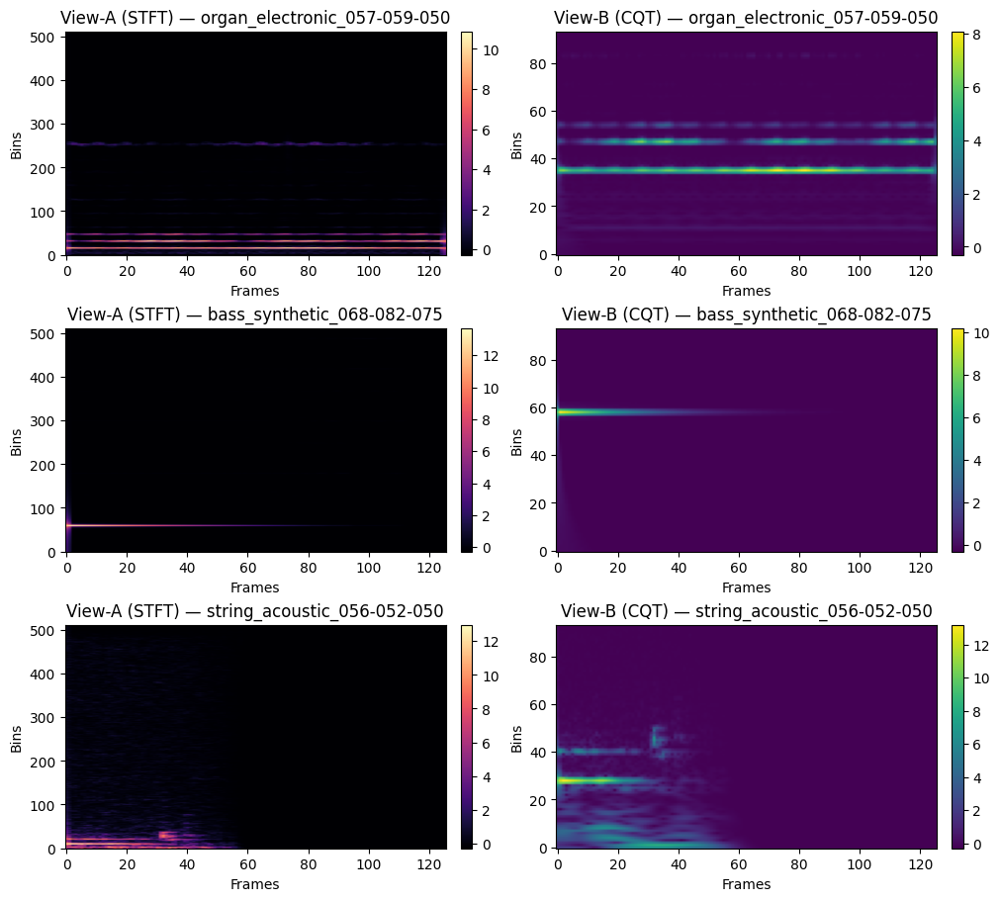

Saved: D:\ELEC 5305 project\nsynth\viz_step5\ssl_dual_views_train_n3.png


In [52]:
def show_ssl_dual_views(split="train", n=3):
    stems = pick_random_stems(n=n, split=split)
    fig, axes = plt.subplots(n, 2, figsize=(10, 3*n), constrained_layout=True)
    if n == 1: axes = np.array([axes])

    for i, st in enumerate(stems):
        S, C = load_pair_from_stem(st)
        Sn = norm_if_stats(S, "stft")
        Cn = norm_if_stats(C, "cqt")

        im0 = axes[i,0].imshow(Sn, origin="lower", aspect="auto", cmap="magma")
        axes[i,0].set_title(f"View-A (STFT) — {st}")
        axes[i,0].set_xlabel("Frames"); axes[i,0].set_ylabel("Bins")
        fig.colorbar(im0, ax=axes[i,0], fraction=0.046, pad=0.04)

        im1 = axes[i,1].imshow(Cn, origin="lower", aspect="auto", cmap="viridis")
        axes[i,1].set_title(f"View-B (CQT) — {st}")
        axes[i,1].set_xlabel("Frames"); axes[i,1].set_ylabel("Bins")
        fig.colorbar(im1, ax=axes[i,1], fraction=0.046, pad=0.04)

    out = VIZ_DIR / f"ssl_dual_views_{split}_n{n}.png"
    fig.savefig(out, dpi=150, bbox_inches="tight")
    plt.show()
    print("Saved:", out)

show_ssl_dual_views("train", n=3)


Self-supervised pre-training

d:\ANN\envs\dl2_pip\lib\site-packages\torch\__init__.py:1605: UserWarning: Please use the new API settings to control TF32 behavior, such as torch.backends.cudnn.conv.fp32_precision = 'tf32' or torch.backends.cuda.matmul.fp32_precision = 'ieee'. Old settings, e.g, torch.backends.cuda.matmul.allow_tf32 = True, torch.backends.cudnn.allow_tf32 = True, allowTF32CuDNN() and allowTF32CuBLAS() will be deprecated after Pytorch 2.9. Please see https://pytorch.org/docs/main/notes/cuda.html#tensorfloat-32-tf32-on-ampere-and-later-devices (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\pytorch\aten\src\ATen\Context.cpp:85.)
  _C._set_float32_matmul_precision(precision)


Device: cuda | AMP dtype: torch.bfloat16
Train/Val sizes = 11382/1296
Priming GPU with warmup batches …
[warmup] start, steps=3
[warmup] batch 1: 0.371s  (S(24, 1, 513, 63), C(24, 1, 94, 63))
[warmup] batch 2: 0.017s  (S(24, 1, 513, 63), C(24, 1, 94, 63))
[warmup] batch 3: 0.013s  (S(24, 1, 513, 63), C(24, 1, 94, 63))
[warmup] done, avg 0.134s/batch
Start training ...
[epoch 01] lr=1.00e-04 | tau(train)=0.260 | tau(eval)=0.299
  iter 00050 | avg_loss 3.0441 | avg_acc 0.110
  iter 00100 | avg_loss 2.9490 | avg_acc 0.145
  iter 00150 | avg_loss 2.8651 | avg_acc 0.180
  iter 00200 | avg_loss 2.7921 | avg_acc 0.204
  iter 00250 | avg_loss 2.7221 | avg_acc 0.231
  iter 00300 | avg_loss 2.6530 | avg_acc 0.254
  iter 00350 | avg_loss 2.5832 | avg_acc 0.272
  iter 00400 | avg_loss 2.5187 | avg_acc 0.293
  iter 00450 | avg_loss 2.4523 | avg_acc 0.314
[01/40] loss(tr)=2.4219 acc(tr)=0.323 | loss(val)=2.5586 acc(val)=0.234
[epoch 02] lr=4.00e-04 | tau(train)=0.260 | tau(eval)=0.299
  iter 00050 |

d:\ANN\envs\dl2_pip\lib\site-packages\torch\optim\lr_scheduler.py:209: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


[03/40] loss(tr)=1.0768 acc(tr)=0.862 | loss(val)=2.2343 acc(val)=0.337
[epoch 04] lr=1.00e-03 | tau(train)=0.259 | tau(eval)=0.297
  iter 00050 | avg_loss 0.9878 | avg_acc 0.895
  iter 00100 | avg_loss 0.9740 | avg_acc 0.902
  iter 00150 | avg_loss 0.9676 | avg_acc 0.903
  iter 00200 | avg_loss 0.9618 | avg_acc 0.905
  iter 00250 | avg_loss 0.9570 | avg_acc 0.903
  iter 00300 | avg_loss 0.9516 | avg_acc 0.904
  iter 00350 | avg_loss 0.9478 | avg_acc 0.904
  iter 00400 | avg_loss 0.9419 | avg_acc 0.905
  iter 00450 | avg_loss 0.9377 | avg_acc 0.906
[04/40] loss(tr)=0.9353 acc(tr)=0.906 | loss(val)=2.3055 acc(val)=0.258
[epoch 05] lr=9.98e-04 | tau(train)=0.257 | tau(eval)=0.296
  iter 00050 | avg_loss 0.9113 | avg_acc 0.905
  iter 00100 | avg_loss 0.8960 | avg_acc 0.908
  iter 00150 | avg_loss 0.8952 | avg_acc 0.911
  iter 00200 | avg_loss 0.8850 | avg_acc 0.915
  iter 00250 | avg_loss 0.8835 | avg_acc 0.913
  iter 00300 | avg_loss 0.8769 | avg_acc 0.914
  iter 00350 | avg_loss 0.8757 

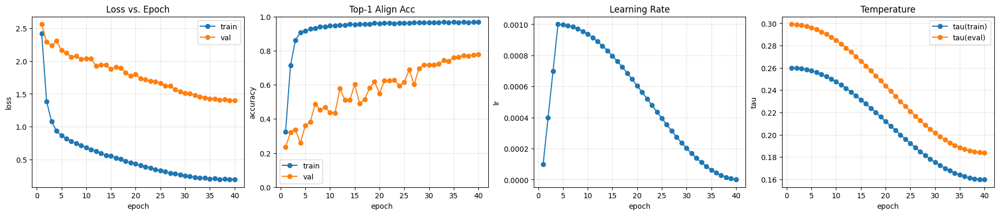

Saved figure: D:\ELEC 5305 project\nsynth\ckpt_simclr\viz\loss_acc_lr_tau_curves.png


In [1]:
# ============================================
# NSynth: STFT↔CQT contrastive pretraining (Windows/Jupyter-stable)
# + Top-1 alignment accuracy & tri-plot visualization
# + (NEW) cosine temperature schedule + LR warmup
# ============================================

import os, json, time, math, random
from dataclasses import dataclass
from pathlib import Path
from typing import Dict, List, Tuple

import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

# -------- CUDA/backend knobs (safe) --------
torch.backends.cudnn.benchmark = True
torch.set_float32_matmul_precision("high")

# -------- Paths --------
ROOT = Path(r"D:\ELEC 5305 project\nsynth")
FEAT_DIR = ROOT / "features_stft_cqt"
MANIFEST_CSV = FEAT_DIR / "manifest.csv"
STATS_NPZ    = ROOT / "feature_stats.npz"

assert FEAT_DIR.exists(), f"features_stft_cqt not found: {FEAT_DIR}"
assert (FEAT_DIR/"stft").exists() and (FEAT_DIR/"cqt").exists(), "stft/cqt folders missing."
assert MANIFEST_CSV.exists(), f"manifest.csv not found under {FEAT_DIR}"
assert STATS_NPZ.exists(), f"feature_stats.npz not found at {STATS_NPZ}"

CKPT_DIR = ROOT / "ckpt_simclr"
(CKPT_DIR / "viz").mkdir(parents=True, exist_ok=True)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
AMP_DTYPE = torch.bfloat16 if device.type == "cuda" else torch.float32
print("Device:", device, "| AMP dtype:", AMP_DTYPE)

# -------- Config --------
@dataclass
class TrainCfg:
    # effective batch = micro_bs * accum_steps
    micro_bs: int = 24
    accum_steps: int = 6

    # Windows/Jupyter: start with 0 to avoid first-batch hang
    num_workers: int = 0

    # (NEW) 训练轮数提升
    epochs: int = 40

    # lr / wd
    base_lr: float = 1e-3
    weight_decay: float = 1e-4

    # temperature baseline（保持你原值附近）
    temperature: float = 0.2
    # (NEW) 轻微温度余弦调度上下界（围绕0.2）
    tau_max: float = 0.26
    tau_min: float = 0.16
    # (NEW) 验证时软化一点点
    tau_eval_scale: float = 1.15

    emb_dim: int = 96
    proj_dim: int = 64

    # IO / shaping knobs
    ram_cache: bool = False
    use_mmap: bool = True
    time_subsample: int = 2

    # logging
    log_every: int = 50
    # (NEW) LR warmup epochs
    warmup_epochs: int = 3

CFG = TrainCfg()

# -------- Dataset --------
class STFTCQTPairDataset(Dataset):
    """Loads STFT/CQT pairs; normalize, time-align, (optional) subsample time."""
    def __init__(self, manifest_csv: Path, stats_npz: Path, split: str,
                 ram_cache: bool = False, use_mmap: bool = True, time_subsample: int = 1):
        df = pd.read_csv(manifest_csv)
        need = {"stem","split","stft_path","cqt_path"}
        assert need.issubset(df.columns), f"manifest must have {need}, got {df.columns.tolist()}"
        df = df[df["split"] == split].reset_index(drop=True)
        self.rows = df[["stem","stft_path","cqt_path"]].to_dict("records")

        stats = np.load(stats_npz)
        self.stft_mean = float(stats["stft_mean"])
        self.stft_std  = float(stats["stft_std"])
        self.cqt_mean  = float(stats["cqt_mean"])
        self.cqt_std   = float(stats["cqt_std"])

        self.ram_cache = ram_cache
        self.use_mmap = use_mmap
        self.time_subsample = max(1, int(time_subsample))

        self.cache_stft: Dict[str, np.ndarray] = {}
        self.cache_cqt:  Dict[str, np.ndarray] = {}

    def __len__(self): return len(self.rows)

    def _center_crop_T(self, A: np.ndarray, T: int) -> np.ndarray:
        TA = A.shape[1]
        if TA == T: return A
        off = max((TA - T)//2, 0)
        return A[:, off:off+T]

    def _load_feat(self, path: str, which: str) -> np.ndarray:
        if self.ram_cache:
            cache = self.cache_stft if which == "stft" else self.cache_cqt
            if path in cache:
                return cache[path]
        if self.use_mmap:
            arr = np.load(path, mmap_mode="r").astype(np.float32, copy=False)
            arr = np.array(arr, dtype=np.float32, copy=True)
        else:
            arr = np.load(path).astype(np.float32, copy=False)
        if self.ram_cache:
            (self.cache_stft if which=="stft" else self.cache_cqt)[path] = arr
        return arr

    def __getitem__(self, idx: int):
        r = self.rows[idx]
        S = self._load_feat(r["stft_path"], "stft")   # [F, T]
        C = self._load_feat(r["cqt_path"],  "cqt")    # [K, T]

        S = (S - self.stft_mean) / max(self.stft_std, 1e-12)
        C = (C - self.cqt_mean) / max(self.cqt_std, 1e-12)

        T = min(S.shape[1], C.shape[1])
        S = self._center_crop_T(S, T)[:, ::self.time_subsample]
        C = self._center_crop_T(C, T)[:, ::self.time_subsample]

        S = np.expand_dims(S, 0)  # [1,F,T]
        C = np.expand_dims(C, 0)  # [1,K,T]
        return torch.from_numpy(S), torch.from_numpy(C), r["stem"]

def make_loader(ds, bs, shuffle, workers):
    """Use workers=0 on Windows/Jupyter to avoid first-batch stall."""
    kwargs = dict(
        batch_size=bs, shuffle=shuffle, num_workers=workers,
        pin_memory=True, drop_last=shuffle,
    )
    if workers and workers > 0:
        kwargs.update(dict(persistent_workers=False, prefetch_factor=4))
    return DataLoader(ds, **kwargs)

# datasets/loaders
train_set = STFTCQTPairDataset(
    MANIFEST_CSV, STATS_NPZ, "train",
    ram_cache=CFG.ram_cache, use_mmap=CFG.use_mmap, time_subsample=CFG.time_subsample
)
val_set   = STFTCQTPairDataset(
    MANIFEST_CSV, STATS_NPZ, "val",
    ram_cache=CFG.ram_cache, use_mmap=CFG.use_mmap, time_subsample=CFG.time_subsample
)
train_loader = make_loader(train_set, CFG.micro_bs, True,  CFG.num_workers)
val_loader   = make_loader(val_set,   CFG.micro_bs, False, min(1, CFG.num_workers))
print(f"Train/Val sizes = {len(train_set)}/{len(val_set)}")

# -------- Model --------
class TinySpectroEncoder(nn.Module):
    """(1,F,T) -> D via small Conv stack + global avg pool."""
    def __init__(self, out_dim=96):
        super().__init__()
        self.net = nn.Sequential(
            nn.Conv2d(1, 32, 3, padding=1), nn.BatchNorm2d(32), nn.ReLU(inplace=True),
            nn.Conv2d(32,64, 3, padding=1), nn.BatchNorm2d(64), nn.ReLU(inplace=True),
            nn.Conv2d(64,128,3, padding=1), nn.BatchNorm2d(128),nn.ReLU(inplace=True),
            nn.Conv2d(128,out_dim,1),       nn.BatchNorm2d(out_dim), nn.ReLU(inplace=True),
        )
        self.pool = nn.AdaptiveAvgPool2d((1,1))
    def forward(self, x):
        z = self.net(x)      # [B,D,F',T']
        z = self.pool(z)     # [B,D,1,1]
        return z.flatten(1)  # [B,D]

class ProjectionMLP(nn.Module):
    """2-layer projection + L2-normalize."""
    def __init__(self, in_dim, out_dim):
        super().__init__()
        self.mlp = nn.Sequential(
            nn.Linear(in_dim, in_dim), nn.ReLU(inplace=True),
            nn.Linear(in_dim, out_dim),
        )
    def forward(self, h):
        z = self.mlp(h)
        return F.normalize(z, dim=-1)

e_stft = TinySpectroEncoder(out_dim=CFG.emb_dim).to(device)
e_cqt  = TinySpectroEncoder(out_dim=CFG.emb_dim).to(device)
proj   = ProjectionMLP(in_dim=CFG.emb_dim, out_dim=CFG.proj_dim).to(device)

# -------- Loss + Top-1 alignment accuracy --------
def contrastive_loss_and_acc(z1: torch.Tensor, z2: torch.Tensor, tau: float):
    """
    Symmetric InfoNCE with in-batch negatives.
    Also returns Top-1 alignment accuracy averaged over two directions.
    """
    B = z1.size(0)
    logits = (z1 @ z2.t()) / tau              # [B,B]
    targets = torch.arange(B, device=z1.device)

    loss_i = F.cross_entropy(logits, targets)       # STFT->CQT
    loss_j = F.cross_entropy(logits.t(), targets)   # CQT->STFT
    loss = 0.5 * (loss_i + loss_j)

    acc_i = (logits.argmax(dim=1) == targets).float().mean()
    acc_j = (logits.t().argmax(dim=1) == targets).float().mean()
    acc = 0.5 * (acc_i + acc_j)
    return loss, acc

# -------- (NEW) temperature per-epoch (cosine around 0.2) --------
def tau_at_epoch(ep_idx: int, total_ep: int) -> float:
    # ep_idx: 0-based
    if CFG.tau_max == CFG.tau_min:
        return CFG.temperature
    cos_t = 0.5 * (1 + math.cos(math.pi * ep_idx / max(1, total_ep-1)))
    return CFG.tau_min + (CFG.tau_max - CFG.tau_min) * cos_t

# -------- Optim & sched --------
params = list(e_stft.parameters()) + list(e_cqt.parameters()) + list(proj.parameters())
opt  = torch.optim.AdamW(params, lr=CFG.base_lr, weight_decay=CFG.weight_decay)

# (NEW) warmup + cosine
from torch.optim.lr_scheduler import LinearLR, SequentialLR, CosineAnnealingLR
sched_warm = LinearLR(opt, start_factor=0.1, end_factor=1.0, total_iters=max(1, CFG.warmup_epochs))
sched_cos  = CosineAnnealingLR(opt, T_max=max(1, CFG.epochs - CFG.warmup_epochs))
sched = SequentialLR(opt, schedulers=[sched_warm, sched_cos], milestones=[CFG.warmup_epochs])

# -------- Warmup: force first few batches to hit GPU --------
@torch.no_grad()
def warmup_gpu(loader, steps=3):
    print(f"[warmup] start, steps={steps}")
    took, n = 0.0, 0
    for i, (S, C, _) in enumerate(loader):
        t0 = time.time()
        S = S.to(device, non_blocking=True).float()
        C = C.to(device, non_blocking=True).float()
        with torch.amp.autocast(device_type="cuda", dtype=AMP_DTYPE, enabled=(device.type=="cuda")):
            _ = proj(e_stft(S)); _ = proj(e_cqt(C))
        if device.type == "cuda":
            torch.cuda.synchronize()
        dt = time.time() - t0
        took += dt; n += 1
        print(f"[warmup] batch {i+1}: {dt:.3f}s  (S{tuple(S.shape)}, C{tuple(C.shape)})")
        if n >= steps: break
    print(f"[warmup] done, avg {took/max(1,n):.3f}s/batch")

# -------- Train/Eval loops (micro-batch + accumulation + AMP) --------
best_loss = float("inf")
history: List[Dict] = []

def run_epoch(loader, train_mode: bool, tau: float) -> Tuple[float, float, int]:
    if train_mode: e_stft.train(); e_cqt.train(); proj.train()
    else:          e_stft.eval();  e_cqt.eval();  proj.eval()

    total_loss, total_acc, n = 0.0, 0.0, 0
    acc_steps = CFG.accum_steps

    if train_mode:
        opt.zero_grad(set_to_none=True)

    for i, (S, C, _) in enumerate(loader, 1):
        S = S.to(device, non_blocking=True).float()
        C = C.to(device, non_blocking=True).float()

        with torch.amp.autocast(device_type="cuda", dtype=AMP_DTYPE, enabled=(device.type=="cuda")):
            h1 = e_stft(S); h2 = e_cqt(C)
            z1 = proj(h1);  z2 = proj(h2)
            loss_step, acc_step = contrastive_loss_and_acc(z1, z2, tau=tau)
            loss = loss_step / acc_steps

        if train_mode:
            loss.backward()
            if i % acc_steps == 0:
                torch.nn.utils.clip_grad_norm_(params, 2.0)
                opt.step()
                opt.zero_grad(set_to_none=True)

        bs = S.size(0)
        total_loss += loss_step.item() * bs
        total_acc  += float(acc_step)  * bs
        n += bs

        if train_mode and (i % CFG.log_every == 0):
            avg_l = total_loss / max(1,n)
            avg_a = total_acc / max(1,n)
            print(f"  iter {i:05d} | avg_loss {avg_l:.4f} | avg_acc {avg_a:.3f}")

    if train_mode and (i % acc_steps != 0):
        torch.nn.utils.clip_grad_norm_(params, 2.0)
        opt.step()
        opt.zero_grad(set_to_none=True)

    return float(total_loss / max(1,n)), float(total_acc / max(1,n)), n

# ---------- Kick-off ----------
print("Priming GPU with warmup batches …")
warmup_gpu(train_loader, steps=3)

print("Start training ...")
for ep in range(1, CFG.epochs+1):
    # (NEW) epoch-wise tau & soft-eval tau
    tau_now = tau_at_epoch(ep-1, CFG.epochs)
    tau_eval = max(tau_now * CFG.tau_eval_scale, tau_now)  # 保证eval不比train更“锐”
    lr_now = float(opt.param_groups[0]["lr"])
    print(f"[epoch {ep:02d}] lr={lr_now:.2e} | tau(train)={tau_now:.3f} | tau(eval)={tau_eval:.3f}")

    tr_loss, tr_acc, _ = run_epoch(train_loader, True,  tau_now)
    val_loss, val_acc, _ = run_epoch(val_loader,   False, tau_eval)

    sched.step()

    history.append({
        "epoch": ep, "train": tr_loss, "val": val_loss,
        "acc_tr": tr_acc, "acc_val": val_acc, "lr": lr_now,
        "tau_tr": tau_now, "tau_val": tau_eval
    })
    print(f"[{ep:02d}/{CFG.epochs}] "
          f"loss(tr)={tr_loss:.4f} acc(tr)={tr_acc:.3f} | "
          f"loss(val)={val_loss:.4f} acc(val)={val_acc:.3f}")

    if val_loss < best_loss:
        best_loss = val_loss
        torch.save({
            "cfg": CFG.__dict__,
            "e_stft": e_stft.state_dict(),
            "e_cqt":  e_cqt.state_dict(),
            "proj":   proj.state_dict(),
            "history": history,
        }, CKPT_DIR / "best.pt")

    torch.save({
        "cfg": CFG.__dict__,
        "e_stft": e_stft.state_dict(),
        "e_cqt":  e_cqt.state_dict(),
        "proj":   proj.state_dict(),
        "history": history,
    }, CKPT_DIR / "last.pt")

with open(CKPT_DIR/"history.json", "w", encoding="utf-8") as f:
    json.dump(history, f, indent=2)

print("Best val loss:", best_loss)
print("Checkpoints saved to:", CKPT_DIR)

# -------- Visualization: Loss + Align-Acc + LR (+ tau) --------
import matplotlib.pyplot as plt

ep   = [h['epoch'] for h in history]
tr_l = [h['train'] for h in history]
va_l = [h['val']   for h in history]
ac_tr = [h['acc_tr'] for h in history]
ac_va = [h['acc_val'] for h in history]
lrs  = [h['lr']    for h in history]
tau_tr = [h['tau_tr'] for h in history]
tau_va = [h['tau_val'] for h in history]

fig, ax = plt.subplots(1,4, figsize=(19,4), constrained_layout=True)

# Loss
ax[0].plot(ep, tr_l, marker='o', label='train')
ax[0].plot(ep, va_l, marker='o', label='val')
ax[0].set_title('Loss vs. Epoch'); ax[0].set_xlabel('epoch'); ax[0].set_ylabel('loss')
ax[0].grid(alpha=.3); ax[0].legend()

# Align-Acc
ax[1].plot(ep, ac_tr, marker='o', label='train')
ax[1].plot(ep, ac_va, marker='o', label='val')
ax[1].set_title('Top-1 Align Acc'); ax[1].set_xlabel('epoch'); ax[1].set_ylabel('accuracy')
ax[1].set_ylim(0, 1.0); ax[1].grid(alpha=.3); ax[1].legend()

# LR
ax[2].plot(ep, lrs, marker='o')
ax[2].set_title('Learning Rate'); ax[2].set_xlabel('epoch'); ax[2].set_ylabel('lr')
ax[2].grid(alpha=.3)

# tau
ax[3].plot(ep, tau_tr, marker='o', label='tau(train)')
ax[3].plot(ep, tau_va, marker='o', label='tau(eval)')
ax[3].set_title('Temperature'); ax[3].set_xlabel('epoch'); ax[3].set_ylabel('tau')
ax[3].grid(alpha=.3); ax[3].legend()

out_png = CKPT_DIR / "viz/loss_acc_lr_tau_curves.png"
fig.savefig(out_png, dpi=150, bbox_inches="tight")
plt.show()
print("Saved figure:", out_png)


# 6 Supervised Training (family+source, 16 classes)

In [10]:
# === Fix manifests by adding the `split` column (Method A) ===
# This script:
# 1) Loads the three manifest CSVs (train/val/test)
# 2) Adds/overwrites a `split` column with fixed values
# 3) Reorders columns to ['stem','instrument','split','stft_path','cqt_path']
# 4) Validates shapes/columns and prints quick stats

from pathlib import Path
import pandas as pd

# ---- Paths (adjust only if your folder name differs) ----
ROOT = Path(r"D:\ELEC 5305 project\nsynth\features_stft_cqt")

MAN_TRAIN = ROOT / "manifest_train_fs_fixed.csv"
MAN_VAL   = ROOT / "manifest_val_fs_fixed.csv"
MAN_TEST  = ROOT / "manifest_test_fs_fixed.csv"

REQUIRED_COLS = ["stem", "instrument", "split", "stft_path", "cqt_path"]

def fix_one_manifest(path: Path, split_value: str) -> pd.DataFrame:
    """Load a manifest, add/overwrite `split`, reorder columns, and save back."""
    assert path.exists(), f"Not found: {path}"
    df = pd.read_csv(path)

    # Add / overwrite `split`
    df["split"] = split_value

    # Basic presence check for required columns (except split we just added)
    for col in ["stem", "instrument", "stft_path", "cqt_path"]:
        if col not in df.columns:
            raise AssertionError(f"{path.name} is missing column: {col}")

    # Reorder columns to the canonical order
    df = df[REQUIRED_COLS]

    # Save in-place without index
    df.to_csv(path, index=False)
    return df

def quick_report(name: str, df: pd.DataFrame):
    """Print quick stats for a manifest dataframe."""
    print(f"\n>>> {name}")
    print(f"rows={len(df)} | cols={list(df.columns)}")
    # show top-10 of instrument histogram
    print("instrument histogram (top-10):")
    print(df["instrument"].value_counts().head(10))

# ---- Run fixes ----
df_tr = fix_one_manifest(MAN_TRAIN, "train")
df_va = fix_one_manifest(MAN_VAL,   "val")
df_te = fix_one_manifest(MAN_TEST,  "test")

# ---- Validate columns and basic integrity ----
for p in [MAN_TRAIN, MAN_VAL, MAN_TEST]:
    df = pd.read_csv(p)
    missing = [c for c in REQUIRED_COLS if c not in df.columns]
    assert not missing, f"{p.name} missing {missing}"
    # quick sanity for path columns
    assert df["stft_path"].astype(str).str.endswith(".npy").all(), f"{p.name}: stft_path should be .npy"
    assert df["cqt_path"].astype(str).str.endswith(".npy").all(),  f"{p.name}: cqt_path should be .npy"

# ---- Reports ----
quick_report(MAN_TRAIN.name, df_tr)
quick_report(MAN_VAL.name,   df_va)
quick_report(MAN_TEST.name,  df_te)

print("\nAll manifests fixed successfully. You can now run Step-6 training.")



>>> manifest_train_fs_fixed.csv
rows=15094 | cols=['stem', 'instrument', 'split', 'stft_path', 'cqt_path']
instrument histogram (top-10):
instrument
bass_synthetic         2566
keyboard_electronic    2061
organ_electronic       1888
guitar_acoustic        1767
brass_acoustic         1038
string_acoustic        1008
reed_acoustic           861
mallet_acoustic         778
guitar_electronic       693
bass_electronic         567
Name: count, dtype: int64

>>> manifest_val_fs_fixed.csv
rows=1680 | cols=['stem', 'instrument', 'split', 'stft_path', 'cqt_path']
instrument histogram (top-10):
instrument
bass_synthetic         285
keyboard_electronic    229
organ_electronic       212
guitar_acoustic        196
brass_acoustic         117
string_acoustic        112
reed_acoustic           94
mallet_acoustic         87
guitar_electronic       77
bass_electronic         63
Name: count, dtype: int64

>>> manifest_test_fs_fixed.csv
rows=4096 | cols=['stem', 'instrument', 'split', 'stft_path', 'cqt_pa

In [1]:
# ============================================
# Step-6 Supervised Training (family+source, 16 classes)
# - ↑ emb_dim=192, dropout=0.2
# - + MixUp(alpha=0.2) with weighted soft CE
# - delayed EMA; raw/EMA validation pick-best
# - epochs=80; mild SpecAug kept
# - fixed-canvas collate; class-weighting kept
# ============================================

import os, json, random, warnings
from dataclasses import dataclass
from pathlib import Path
from typing import Dict, List, Tuple

import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import matplotlib.pyplot as plt

warnings.filterwarnings("ignore", category=UserWarning)

# ---------- Paths ----------
ROOT = Path(r"D:\ELEC 5305 project\nsynth")
FEAT_DIR = ROOT / "features_stft_cqt"
MAN_TRAIN = FEAT_DIR / "manifest_train_fs_fixed.csv"
MAN_VAL   = FEAT_DIR / "manifest_val_fs_fixed.csv"
MAN_TEST  = FEAT_DIR / "manifest_test_fs_fixed.csv"
STATS_NPZ = ROOT / "feature_stats.npz"
LABEL_JSON= ROOT / "label2idx_fs.json"
CKPT_DIR  = ROOT / "ckpt_sup_step6"
VIZ_DIR   = CKPT_DIR / "viz"
VIZ_DIR.mkdir(parents=True, exist_ok=True)
for p in [MAN_TRAIN, MAN_VAL, MAN_TEST, STATS_NPZ, LABEL_JSON]:
    assert Path(p).exists(), f"Missing file: {p}"

# ---------- Device / AMP ----------
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
AMP_DTYPE = torch.bfloat16 if device.type == "cuda" else torch.float32
torch.backends.cudnn.benchmark = True
torch.set_float32_matmul_precision("high")
print(f"Device: {device} | AMP dtype: torch.{str(AMP_DTYPE).split('.')[-1]}")

# ---------- Config ----------
@dataclass
class Cfg:
    micro_bs: int = 32
    accum_steps: int = 2
    num_workers: int = 0
    pin_memory: bool = True
    ram_cache: bool = False
    use_mmap: bool  = True

    # fixed canvas
    max_T: int = 256
    max_F_stft: int = 513
    max_K_cqt: int  = 96

    epochs: int = 80                # ↑ train longer with EMA+MixUp
    base_lr: float = 3e-3
    weight_decay: float = 1e-4
    warmup_epochs: int = 3
    grad_clip: float = 2.0
    log_every: int = 100

    # SpecAug (mild)
    aug_freq_masks: int = 2
    aug_time_masks: int = 2
    aug_f: int = 12
    aug_t: int = 18
    aug_p: float = 0.4

    # EMA
    ema_decay: float = 0.999
    ema_start_epoch: int = 3

    # MixUp
    mixup_alpha: float = 0.20
    mixup_prob: float = 0.80

CFG = Cfg()

# ---------- Labels / Stats ----------
with open(LABEL_JSON, "r", encoding="utf-8") as f:
    label2idx: Dict[str, int] = json.load(f)
idx2label = {v: k for k, v in label2idx.items()}
NUM_CLASSES = len(label2idx)
print("NUM_CLASSES =", NUM_CLASSES)

stats = np.load(STATS_NPZ)
STFT_MEAN, STFT_STD = float(stats["stft_mean"]), float(stats["stft_std"])
CQT_MEAN,  CQT_STD  = float(stats["cqt_mean"]),  float(stats["cqt_std"])
REQUIRED_COLS = {"stem", "instrument", "split", "stft_path", "cqt_path"}

# ---------- Dataset ----------
class PairClsDataset(Dataset):
    def __init__(self, manifest_csv: Path, allow_unknown=False, ram_cache=False, use_mmap=True):
        df = pd.read_csv(manifest_csv)
        assert REQUIRED_COLS.issubset(df.columns)
        self.rows = df[["stem","instrument","stft_path","cqt_path"]].to_dict("records")
        self.allow_unknown = allow_unknown
        self.ram_cache = ram_cache
        self.use_mmap = use_mmap
        self.cache: Dict[str, np.ndarray] = {}
    def __len__(self): return len(self.rows)
    def _load_npy(self, path: str) -> np.ndarray:
        if self.ram_cache and path in self.cache: return self.cache[path]
        if self.use_mmap:
            arr = np.load(path, mmap_mode="r").astype(np.float32, copy=False)
            arr = np.array(arr, dtype=np.float32, copy=True)
        else:
            arr = np.load(path).astype(np.float32, copy=False)
        if self.ram_cache: self.cache[path] = arr
        return arr
    def __getitem__(self, idx: int):
        r = self.rows[idx]
        S = self._load_npy(r["stft_path"])
        C = self._load_npy(r["cqt_path"])
        S = (S - STFT_MEAN) / max(STFT_STD, 1e-12)
        C = (C - CQT_MEAN)  / max(CQT_STD,  1e-12)
        S = np.expand_dims(S, 0); C = np.expand_dims(C, 0)
        y = -1 if self.allow_unknown else label2idx[r["instrument"]]
        return torch.from_numpy(S), torch.from_numpy(C), y, r["stem"]

# ---------- Fixed-canvas Collate ----------
def collate_fixed_align(batch):
    S_list, C_list, y_list, stems = zip(*batch)
    T_pad, F_tgt, K_tgt = CFG.max_T, CFG.max_F_stft, CFG.max_K_cqt
    B = len(batch)
    S_out = torch.zeros(B, 1, F_tgt, T_pad, dtype=torch.float32)
    C_out = torch.zeros(B, 1, K_tgt, T_pad, dtype=torch.float32)
    for i, (S, C) in enumerate(zip(S_list, C_list)):
        T0 = int(S.size(-1)); T_use = min(T0, T_pad); off_t = max((T0 - T_use)//2, 0)
        S_t = S[..., off_t:off_t+T_use]; C_t = C[..., off_t:off_t+T_use]
        F0 = int(S_t.size(-2)); F_use = min(F0, F_tgt); off_f = max((F0 - F_use)//2, 0)
        K0 = int(C_t.size(-2)); K_use = min(K0, K_tgt); off_k = max((K0 - K_use)//2, 0)
        S_fk = S_t[:, off_f:off_f+F_use, :]; C_fk = C_t[:, off_k:off_k+K_use, :]
        S_out[i, :, :F_use, :T_use] = S_fk; C_out[i, :, :K_use, :T_use] = C_fk
    y = torch.tensor(y_list, dtype=torch.long)
    return S_out, C_out, y, list(stems)

# ---------- SpecAug ----------
def specaugment_pair(S, C):
    if random.random() > CFG.aug_p: return S, C
    B, _, Fs, T = S.shape; _, _, Kc, _ = C.shape
    for _ in range(CFG.aug_freq_masks):
        f = random.randint(0, CFG.aug_f)
        f0 = random.randint(0, max(0, Fs - f))
        if f > 0: S[:,:,f0:f0+f,:] = 0
        f = random.randint(0, CFG.aug_f)
        f0 = random.randint(0, max(0, Kc - f))
        if f > 0: C[:,:,f0:f0+f,:] = 0
    for _ in range(CFG.aug_time_masks):
        t = random.randint(0, CFG.aug_t)
        t0 = random.randint(0, max(0, T - t))
        if t > 0: S[:,:,:,t0:t0+t] = 0; C[:,:,:,t0:t0+t] = 0
    return S, C

# ---------- DataLoaders ----------
def make_loader(manifest, allow_unknown=False, shuffle=False):
    ds = PairClsDataset(manifest, allow_unknown=allow_unknown,
                        ram_cache=CFG.ram_cache, use_mmap=CFG.use_mmap)
    return DataLoader(
        ds, batch_size=CFG.micro_bs, shuffle=shuffle,
        num_workers=CFG.num_workers, pin_memory=CFG.pin_memory,
        drop_last=shuffle, collate_fn=collate_fixed_align
    )

train_loader = make_loader(MAN_TRAIN, allow_unknown=False, shuffle=True)
val_loader   = make_loader(MAN_VAL,   allow_unknown=False, shuffle=False)
test_loader  = make_loader(MAN_TEST,  allow_unknown=True,  shuffle=False)
print(f"Train/Val/Test = {len(train_loader.dataset)}/{len(val_loader.dataset)}/{len(test_loader.dataset)} | classes={NUM_CLASSES}")

# ---------- Class weights ----------
def compute_class_weights(manifest_csv: Path, label2idx: Dict[str,int]) -> torch.Tensor:
    df = pd.read_csv(manifest_csv)
    counts = df["instrument"].value_counts().reindex(list(label2idx.keys())).fillna(1)
    freq = counts.values.astype(np.float64)
    w = 1.0 / np.maximum(freq, 1.0)
    w = w / w.mean()
    return torch.tensor(w, dtype=torch.float32)
class_weights = compute_class_weights(MAN_TRAIN, label2idx).to(device)

# ---------- Model ----------
class Tiny2DSpectroEncoder(nn.Module):
    def __init__(self, out_dim=192):   # ↑ 128 -> 192
        super().__init__()
        self.net = nn.Sequential(
            nn.Conv2d(1, 32, 3, padding=1), nn.BatchNorm2d(32), nn.SiLU(inplace=True),
            nn.Conv2d(32,64, 3, padding=1), nn.BatchNorm2d(64), nn.SiLU(inplace=True),
            nn.Conv2d(64,128,3, padding=1), nn.BatchNorm2d(128),nn.SiLU(inplace=True),
            nn.Conv2d(128,out_dim,1),       nn.BatchNorm2d(out_dim), nn.SiLU(inplace=True),
        )
        self.pool = nn.AdaptiveAvgPool2d((1,1))
    def forward(self, x):
        z = self.net(x); z = self.pool(z); return z.flatten(1)

class STFTCQTClassifier(nn.Module):
    def __init__(self, emb_dim=192, num_classes=16, p_drop=0.2):  # ↑ dropout
        super().__init__()
        self.enc_s = Tiny2DSpectroEncoder(out_dim=emb_dim)
        self.enc_c = Tiny2DSpectroEncoder(out_dim=emb_dim)
        self.head  = nn.Sequential(
            nn.Linear(emb_dim*2, emb_dim), nn.SiLU(inplace=True),
            nn.Dropout(p_drop),
            nn.Linear(emb_dim, num_classes)
        )
    def forward(self, s, c):
        hs = self.enc_s(s); hc = self.enc_c(c)
        return self.head(torch.cat([hs, hc], dim=-1))

model = STFTCQTClassifier(emb_dim=192, num_classes=NUM_CLASSES).to(device)

# ---------- Optim / Sched ----------
params = [p for p in model.parameters() if p.requires_grad]
opt = torch.optim.AdamW(params, lr=CFG.base_lr, weight_decay=CFG.weight_decay)

from torch.optim.lr_scheduler import LinearLR, SequentialLR, CosineAnnealingLR
sched_warm = LinearLR(opt, start_factor=0.1, end_factor=1.0, total_iters=max(1, CFG.warmup_epochs))
sched_cos  = CosineAnnealingLR(opt, T_max=max(1, CFG.epochs - CFG.warmup_epochs))
sched = SequentialLR(opt, schedulers=[sched_warm, sched_cos], milestones=[CFG.warmup_epochs])

# ---------- Losses ----------
ce_val = nn.CrossEntropyLoss(weight=class_weights)  # evaluation CE

def weighted_soft_ce(logits: torch.Tensor,
                     target_soft: torch.Tensor,      # [B, C] soft label
                     class_weights: torch.Tensor,    # [C]
                     label_smoothing: float = 0.05) -> torch.Tensor:
    # optional label smoothing on soft labels
    if label_smoothing > 0:
        K = target_soft.size(1)
        target_soft = (1 - label_smoothing) * target_soft + label_smoothing / K
    logp = F.log_softmax(logits, dim=1)             # [B, C]
    cw = class_weights.view(1, -1)                  # [1, C]
    num = -(target_soft * logp * cw).sum(dim=1)     # class-weighted soft CE
    den = (target_soft * cw).sum(dim=1).clamp_min(1e-8)
    return (num / den).mean()

# ---------- EMA ----------
class EMA:
    def __init__(self, model, decay=0.999):
        self.decay = decay
        self.shadow = {k: v.detach().clone() for k, v in model.state_dict().items()}
        self.backup = None
    @torch.no_grad()
    def update(self, model):
        for k, v in model.state_dict().items():
            if v.dtype.is_floating_point:
                self.shadow[k].mul_(self.decay).add_(v.detach(), alpha=1.0 - self.decay)
    @torch.no_grad()
    def apply_to(self, model):
        self.backup = {k: v.detach().clone() for k,v in model.state_dict().items()}
        model.load_state_dict(self.shadow, strict=False)
    @torch.no_grad()
    def restore(self, model):
        if self.backup is not None:
            model.load_state_dict(self.backup, strict=False)
            self.backup = None

ema = EMA(model, decay=CFG.ema_decay)

# ---------- Warm-up few batches ----------
@torch.no_grad()
def warmup(loader, steps=2):
    model.train()
    it = iter(loader)
    for _ in range(steps):
        s, c, y, _ = next(it)
        s = s.to(device).float(); c = c.to(device).float()
        with torch.amp.autocast(device_type=device.type, dtype=AMP_DTYPE, enabled=(device.type=="cuda")):
            _ = model(s, c)

print("Warm-up ..."); warmup(train_loader, steps=2)

# ---------- MixUp ----------
def maybe_mixup(s, c, y, alpha=0.2, prob=0.8, num_classes=16):
    if alpha <= 0 or random.random() > prob:
        y_soft = F.one_hot(y, num_classes).float()
        return s, c, y_soft
    lam = np.random.beta(alpha, alpha)
    idx = torch.randperm(s.size(0), device=s.device)
    s = lam * s + (1 - lam) * s[idx]
    c = lam * c + (1 - lam) * c[idx]
    y1 = F.one_hot(y, num_classes).float()
    y2 = F.one_hot(y[idx], num_classes).float()
    y_soft = lam * y1 + (1 - lam) * y2
    return s, c, y_soft

# ---------- Train / Eval ----------
best_val = {"loss": float("inf"), "acc": 0.0}
history: List[Dict] = []

def run_one_epoch(loader, train_mode: bool, use_specaug: bool) -> Tuple[float, float, int]:
    model.train(train_mode)
    total_loss, total_acc, seen = 0.0, 0.0, 0
    if train_mode: opt.zero_grad(set_to_none=True)

    for it, (s, c, y, _) in enumerate(loader, 1):
        s = s.to(device, non_blocking=True).float()
        c = c.to(device, non_blocking=True).float()
        y = y.to(device, non_blocking=True).long()

        if train_mode and use_specaug:
            s, c = specaugment_pair(s, c)
        if train_mode:
            s, c, y_soft = maybe_mixup(
                s, c, y,
                alpha=CFG.mixup_alpha, prob=CFG.mixup_prob, num_classes=NUM_CLASSES
            )

        with torch.amp.autocast(device_type=device.type, dtype=AMP_DTYPE, enabled=(device.type=="cuda")):
            logits = model(s, c)
            if train_mode:
                loss = weighted_soft_ce(logits, y_soft, class_weights, label_smoothing=0.05)
                loss = loss / CFG.accum_steps
            else:
                loss = ce_val(logits, y) / CFG.accum_steps

        if train_mode:
            loss.backward()
            if it % CFG.accum_steps == 0:
                nn.utils.clip_grad_norm_(model.parameters(), CFG.grad_clip)
                opt.step()
                opt.zero_grad(set_to_none=True)
                if current_epoch >= CFG.ema_start_epoch:
                    ema.update(model)

        with torch.no_grad():
            bs = y.size(0)
            pred = logits.argmax(dim=1)
            acc  = (pred == y).float().sum()
            total_loss += float(loss.item()) * CFG.accum_steps * bs
            total_acc  += float(acc.item())
            seen       += bs

        if train_mode and (it % CFG.log_every == 0):
            print(f"  iter {it:05d} | loss(avg) {total_loss/max(1,seen):.4f} | acc(avg) {total_acc/max(1,seen):.3f}")

    if train_mode and (it % CFG.accum_steps != 0):
        nn.utils.clip_grad_norm_(model.parameters(), CFG.grad_clip)
        opt.step(); opt.zero_grad(set_to_none=True)
        if current_epoch >= CFG.ema_start_epoch:
            ema.update(model)

    return total_loss/max(1,seen), total_acc/max(1,seen), seen

@torch.no_grad()
def eval_with_and_without_ema(loader):
    # raw
    model.eval()
    raw_loss, raw_acc, _ = run_one_epoch(loader, train_mode=False, use_specaug=False)
    # ema (only if started)
    ema_loss, ema_acc = raw_loss, raw_acc
    if current_epoch >= CFG.ema_start_epoch:
        ema.apply_to(model)
        ema_loss, ema_acc, _ = run_one_epoch(loader, train_mode=False, use_specaug=False)
        ema.restore(model)
    if ema_acc >= raw_acc:
        return ema_loss, ema_acc, "ema"
    else:
        return raw_loss, raw_acc, "raw"

for current_epoch in range(1, CFG.epochs+1):
    lr_now = float(opt.param_groups[0]["lr"])
    print(f"\n[Epoch {current_epoch:02d}/{CFG.epochs}] lr={lr_now:.2e}")

    tr_loss, tr_acc, _ = run_one_epoch(train_loader, train_mode=True, use_specaug=True)
    val_loss, val_acc, tag = eval_with_and_without_ema(val_loader)

    sched.step()
    history.append({"epoch": current_epoch, "train_loss": tr_loss, "train_acc": tr_acc,
                    "val_loss": val_loss, "val_acc": val_acc, "lr": lr_now, "val_tag": tag})
    print(f"  -> train loss={tr_loss:.4f} acc={tr_acc:.3f} | val({tag}) loss={val_loss:.4f} acc={val_acc:.3f}")

    torch.save({"cfg": CFG.__dict__, "model": model.state_dict(),
                "ema": ema.shadow, "label2idx": label2idx, "history": history},
               CKPT_DIR / "last.pt")

    if val_loss < best_val["loss"]:
        best_val = {"loss": val_loss, "acc": val_acc}
        torch.save({"cfg": CFG.__dict__, "model": model.state_dict(),
                    "ema": ema.shadow, "label2idx": label2idx, "history": history},
                   CKPT_DIR / "best.pt")

print(f"\nTraining finished. Best val: {{'val_loss': {best_val['loss']:.4f}, 'val_acc': {best_val['acc']:.3f}}}")
print("Checkpoints saved to:", CKPT_DIR)

# ---------- Visualization ----------
ep = [h['epoch'] for h in history]
tr_l = [h['train_loss'] for h in history]
va_l = [h['val_loss']   for h in history]
tr_a = [h['train_acc']  for h in history]
va_a = [h['val_acc']    for h in history]
lrs  = [h['lr']         for h in history]

fig, ax = plt.subplots(1,3, figsize=(16,4), constrained_layout=True)
ax[0].plot(ep, tr_l, marker='o', label='train'); ax[0].plot(ep, va_l, marker='o', label='val')
ax[0].set_title('Loss'); ax[0].set_xlabel('epoch'); ax[0].grid(alpha=.3); ax[0].legend()
ax[1].plot(ep, tr_a, marker='o', label='train'); ax[1].plot(ep, va_a, marker='o', label='val')
ax[1].set_title('Accuracy'); ax[1].set_xlabel('epoch'); ax[1].set_ylim(0,1.0); ax[1].grid(alpha=.3); ax[1].legend()
ax[2].plot(ep, lrs, marker='o'); ax[2].set_title('LR'); ax[2].set_xlabel('epoch'); ax[2].grid(alpha=.3)

out_png = VIZ_DIR / "curves_step6.png"
fig.savefig(out_png, dpi=150, bbox_inches="tight")
plt.close(fig)
print("Saved figure:", out_png)

# ---------- Unknown test ----------
print("\n=== Simple 'test' pass on unknown set (no labels) ===")
model.eval()
if CFG.ema_start_epoch and history[-1]["val_tag"] == "ema":
    ema.apply_to(model)
all_max = []
with torch.no_grad(), torch.inference_mode():
    for s, c, _, _ in test_loader:
        s = s.to(device, non_blocking=True).float()
        c = c.to(device, non_blocking=True).float()
        with torch.amp.autocast(device_type=device.type, dtype=AMP_DTYPE, enabled=(device.type=='cuda')):
            logits = model(s, c)
        m = logits.float().max(dim=1).values.detach().cpu().numpy()
        all_max.append(m)
if CFG.ema_start_epoch and history[-1]["val_tag"] == "ema":
    ema.restore(model)

if all_max:
    mx = np.concatenate(all_max)
    print(f"Test(unknown) max-logit stats: mean={mx.mean():.3f} | std={mx.std():.3f} | "
          f"p50={np.percentile(mx,50):.3f} | p90={np.percentile(mx,90):.3f}")
else:
    print("Test loader is empty.")


Device: cuda | AMP dtype: torch.bfloat16
NUM_CLASSES = 16
Train/Val/Test = 15094/1680/4096 | classes=16
Warm-up ...

[Epoch 01/80] lr=3.00e-04
  iter 00100 | loss(avg) 2.7269 | acc(avg) 0.142
  iter 00200 | loss(avg) 2.6797 | acc(avg) 0.147
  iter 00300 | loss(avg) 2.6551 | acc(avg) 0.155
  iter 00400 | loss(avg) 2.6390 | acc(avg) 0.164
  -> train loss=2.6318 acc=0.167 | val(ema) loss=2.4313 acc=0.209

[Epoch 02/80] lr=1.20e-03
  iter 00100 | loss(avg) 2.5941 | acc(avg) 0.182
  iter 00200 | loss(avg) 2.5795 | acc(avg) 0.191
  iter 00300 | loss(avg) 2.5625 | acc(avg) 0.189
  iter 00400 | loss(avg) 2.5472 | acc(avg) 0.194
  -> train loss=2.5411 acc=0.194 | val(ema) loss=2.2526 acc=0.276

[Epoch 03/80] lr=2.10e-03
  iter 00100 | loss(avg) 2.4930 | acc(avg) 0.191
  iter 00200 | loss(avg) 2.4904 | acc(avg) 0.201
  iter 00300 | loss(avg) 2.4796 | acc(avg) 0.202
  iter 00400 | loss(avg) 2.4689 | acc(avg) 0.207
  -> train loss=2.4637 acc=0.211 | val(raw) loss=2.1705 acc=0.281

[Epoch 04/80] lr

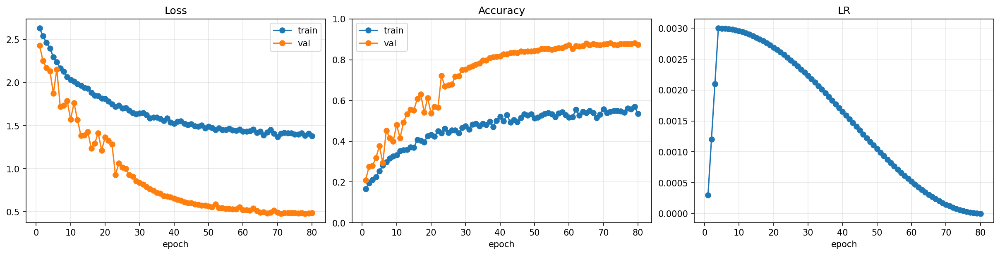

In [1]:
from IPython.display import Image, display

display(Image(filename=r"D:\ELEC 5305 project\nsynth\ckpt_sup_step6\viz\curves_step6.png"))


# 7. STFT × CQT Multi-Task Learning (MTL)

Device: cuda | AMP dtype: torch.bfloat16
NUM_CLASSES (instrument) = 16
NUM_CLASSES=16 | Train/Val/Test = 15094/1680/4096
Warm-up ...

[Epoch 01/80] lr=2.00e-04
  iter 00100 | loss(avg) 0.0000 | acc(avg) 0.125
  iter 00200 | loss(avg) 0.0000 | acc(avg) 0.170
  iter 00300 | loss(avg) 0.0000 | acc(avg) 0.205
  iter 00400 | loss(avg) 0.0000 | acc(avg) 0.232
  -> train loss=0.0000 acc=0.249 | val loss=0.0000 acc=0.141

[Epoch 02/80] lr=8.00e-04
  iter 00100 | loss(avg) 0.0000 | acc(avg) 0.341
  iter 00200 | loss(avg) 0.0000 | acc(avg) 0.357
  iter 00300 | loss(avg) 0.0000 | acc(avg) 0.378
  iter 00400 | loss(avg) 0.0000 | acc(avg) 0.397
  -> train loss=0.0000 acc=0.411 | val loss=0.0000 acc=0.152

[Epoch 03/80] lr=1.40e-03
  iter 00100 | loss(avg) 0.0000 | acc(avg) 0.457
  iter 00200 | loss(avg) 0.0000 | acc(avg) 0.462
  iter 00300 | loss(avg) 0.0000 | acc(avg) 0.474
  iter 00400 | loss(avg) 0.0000 | acc(avg) 0.478
  -> train loss=0.0000 acc=0.486 | val loss=0.0000 acc=0.169

[Epoch 04/80] 

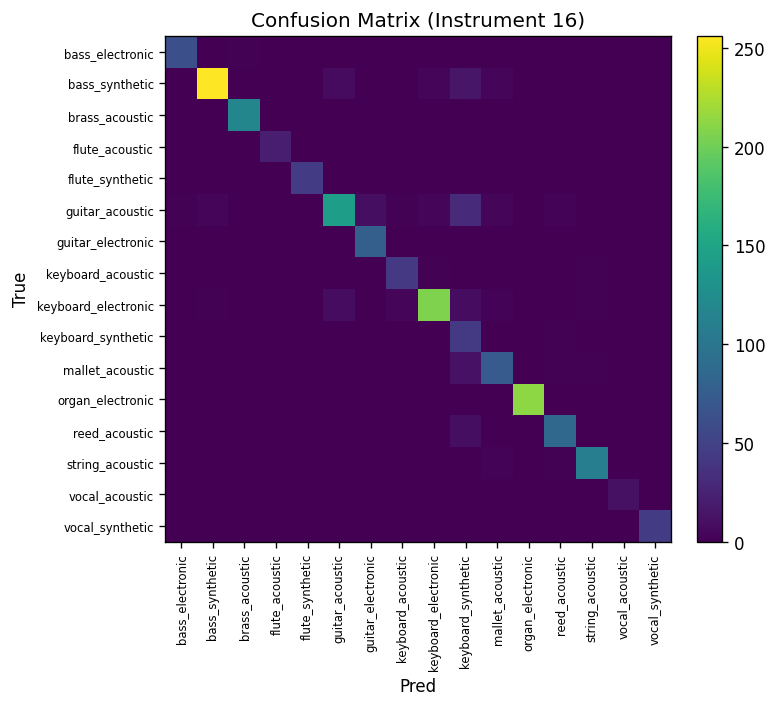

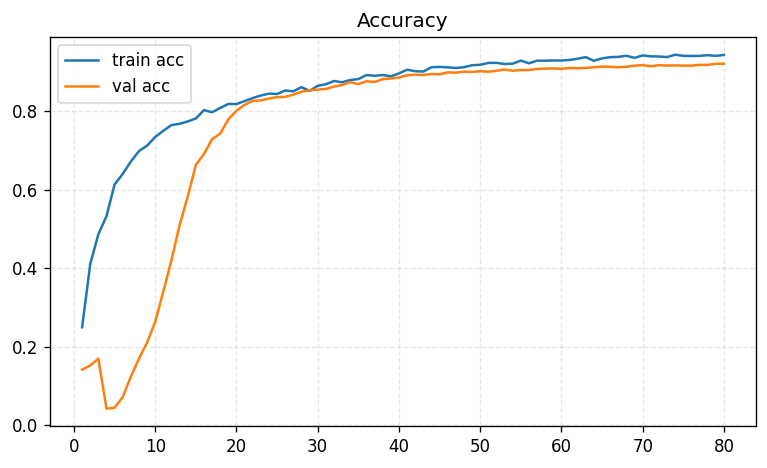

                     precision    recall  f1-score   support

    bass_electronic      0.984     0.984     0.984        63
     bass_synthetic      0.985     0.898     0.939       285
     brass_acoustic      0.992     1.000     0.996       117
     flute_acoustic      1.000     1.000     1.000        21
    flute_synthetic      1.000     1.000     1.000        44
    guitar_acoustic      0.905     0.730     0.808       196
  guitar_electronic      0.895     1.000     0.945        77
  keyboard_acoustic      0.913     0.955     0.933        44
keyboard_electronic      0.963     0.900     0.930       229
 keyboard_synthetic      0.368     0.977     0.534        44
    mallet_acoustic      0.869     0.839     0.854        87
   organ_electronic      1.000     1.000     1.000       212
      reed_acoustic      0.944     0.904     0.924        94
    string_acoustic      0.973     0.973     0.973       112
     vocal_acoustic      1.000     1.000     1.000        11
    vocal_synthetic    

In [ ]:
# ============================================
# Step-7: STFT × CQT Multi-Task Learning (MTL)

import os, re, json, math, time, random, warnings
from dataclasses import dataclass
from pathlib import Path
from typing import Dict, List, Tuple, Optional

import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt

try:
    matplotlib.use("module://matplotlib_inline.backend_inline")
except Exception:
    pass
plt.rcParams["figure.dpi"] = 120

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler

from sklearn.metrics import (
    confusion_matrix, classification_report, f1_score,
    precision_score, recall_score
)

warnings.filterwarnings("ignore", category=UserWarning)

# --------- Paths ----------
ROOT = Path(r"D:\ELEC 5305 project\nsynth")
FEAT_DIR = ROOT / "features_stft_cqt"
MAN_TRAIN = FEAT_DIR / "manifest_train_fs_fixed.csv"
MAN_VAL   = FEAT_DIR / "manifest_val_fs_fixed.csv"
MAN_TEST  = FEAT_DIR / "manifest_test_fs_fixed.csv"
STATS_NPZ = ROOT / "feature_stats.npz"
LABEL_JSON= ROOT / "label2idx_fs.json"
CKPT_DIR  = ROOT / "ckpt_sup_step7"
VIZ_DIR   = CKPT_DIR / "viz"
VIZ_DIR.mkdir(parents=True, exist_ok=True)

for p in [MAN_TRAIN, MAN_VAL, MAN_TEST, STATS_NPZ, LABEL_JSON]:
    assert Path(p).exists(), f"Missing file: {p}"

# --------- Device / AMP ----------
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
AMP_DTYPE = torch.bfloat16 if device.type == "cuda" else torch.float32
torch.backends.cudnn.benchmark = True
torch.set_float32_matmul_precision("high")
print(f"Device: {device} | AMP dtype: torch.{str(AMP_DTYPE).split('.')[-1]}")

# --------- Config ----------
@dataclass
class Cfg:
    micro_bs: int = 32
    accum_steps: int = 2
    num_workers: int = 0
    pin_memory: bool = True
    ram_cache: bool = False
    use_mmap: bool  = True

    max_T: int = 256
    max_F_stft: int = 513
    max_K_cqt: int  = 96

    epochs: int = 80
    base_lr: float = 2e-3
    weight_decay: float = 1e-4
    warmup_epochs: int = 3
    grad_clip: float = 2.0

    log_every: int = 100

    # SpecAug
    aug_freq_masks: int = 2
    aug_time_masks: int = 2
    aug_f: int = 16
    aug_t: int = 24
    aug_p: float = 0.5

    # EMA
    ema_decay: float = 0.999

    # classes
    num_instr: int = 16
    num_family: int = 10
    num_octave: int = 11
    num_velbin: int = 6

CFG = Cfg()

# --------- Label map ----------
with open(LABEL_JSON, "r", encoding="utf-8") as f:
    label2idx: Dict[str, int] = json.load(f)
idx2label = {v: k for k, v in label2idx.items()}
NUM_CLASSES = len(label2idx)
assert NUM_CLASSES == CFG.num_instr, "label2idx classes != CFG.num_instr"
print("NUM_CLASSES (instrument) =", NUM_CLASSES)

# --------- Stats ----------
stats = np.load(STATS_NPZ)
EPS = 1e-6
STFT_MEAN, STFT_STD = float(stats["stft_mean"]), float(stats["stft_std"]) + EPS
CQT_MEAN,  CQT_STD  = float(stats["cqt_mean"]),  float(stats["cqt_std"])  + EPS

REQUIRED_COLS = {"stem", "instrument", "split", "stft_path", "cqt_path"}

# --------- helpers ----------
FAMILY_FROM_INSTR = lambda inst: inst.split("_")[0]
_STEM_RE = re.compile(r".*_(\d+)-(\d+)-(\d+)\.npy$")

def parse_pitch_velocity_from_stem(stem: str) -> Tuple[Optional[int], Optional[int]]:
    m = _STEM_RE.match(stem)
    if not m: return None, None
    try:
        pitch = int(m.group(2)); vel = int(m.group(3))
        return pitch, vel
    except:
        return None, None

def pitch_to_octave_bin(pitch: Optional[int]) -> Optional[int]:
    if pitch is None: return None
    octv = pitch // 12 - 1
    octv = max(-5, min(5, octv))
    return octv + 5

def velocity_to_bin(vel: Optional[int], bins: int = CFG.num_velbin) -> Optional[int]:
    if vel is None: return None
    vel = max(0, min(127, vel))
    step = 128 / bins
    b = int(vel // step)
    return min(b, bins - 1)

# --------- Dataset ----------
class PairMTLDataset(Dataset):
    def __init__(self, manifest_csv: Path, allow_unknown: bool = False,
                 ram_cache: bool = False, use_mmap: bool = True):
        df = pd.read_csv(manifest_csv)
        assert REQUIRED_COLS.issubset(df.columns), f"manifest must have {REQUIRED_COLS}, got {df.columns.tolist()}"

        has_family  = "family" in df.columns
        has_pitch   = "pitch" in df.columns
        has_octbin  = "octave_bin" in df.columns
        has_velbin  = "velocity_bin" in df.columns

        rows = []
        for _, r in df.iterrows():
            stem  = str(r["stem"])
            instr = str(r["instrument"])
            stft_p= str(r["stft_path"])
            cqt_p = str(r["cqt_path"])

            fam = str(r["family"]) if has_family else FAMILY_FROM_INSTR(instr)
            pitch = int(r["pitch"]) if has_pitch and not pd.isna(r["pitch"]) else None
            if pitch is None:
                p, v = parse_pitch_velocity_from_stem(stem)
                pitch = p; vel = v
            else:
                vel = int(r["velocity"]) if "velocity" in df.columns and not pd.isna(r["velocity"]) else None

            octbin = int(r["octave_bin"]) if has_octbin and not pd.isna(r["octave_bin"]) else pitch_to_octave_bin(pitch)
            velbin = int(r["velocity_bin"]) if has_velbin and not pd.isna(r["velocity_bin"]) else velocity_to_bin(vel, CFG.num_velbin)

            rows.append({
                "stem": stem, "instrument": instr, "family": fam,
                "octave_bin": octbin, "velocity_bin": velbin,
                "stft_path": stft_p, "cqt_path": cqt_p
            })

        self.rows = rows
        self.allow_unknown = allow_unknown
        self.ram_cache = ram_cache
        self.use_mmap = use_mmap
        self.cache: Dict[str, np.ndarray] = {}

        fam_names = [r["family"] for r in self.rows]
        freq = pd.Series(fam_names).value_counts()
        keep = list(freq.index[:CFG.num_family-1])
        self.fam2idx = {k:i for i,k in enumerate(keep)}
        self.fam_other = CFG.num_family - 1

    def __len__(self): return len(self.rows)

    def _load_npy(self, path: str) -> np.ndarray:
        if self.ram_cache and path in self.cache:
            return self.cache[path]
        if self.use_mmap:
            arr = np.load(path, mmap_mode="r").astype(np.float32, copy=False)
            arr = np.array(arr, dtype=np.float32, copy=True)
        else:
            arr = np.load(path).astype(np.float32, copy=False)
        if self.ram_cache:
            self.cache[path] = arr
        return arr

    def _family_idx(self, fam: str) -> int:
        return self.fam2idx.get(fam, self.fam_other)

    def __getitem__(self, idx: int):
        r = self.rows[idx]
        stem = r["stem"]; instr = r["instrument"]

        S = self._load_npy(r["stft_path"])
        C = self._load_npy(r["cqt_path"])
        S = np.clip((S - STFT_MEAN) / STFT_STD, -8.0, 8.0)
        C = np.clip((C - CQT_MEAN)  / CQT_STD,  -8.0, 8.0)
        S = np.expand_dims(S, 0)
        C = np.expand_dims(C, 0)

        y_instr = -1 if self.allow_unknown else label2idx[instr]
        y_family = self._family_idx(r["family"])
        y_octbin = r["octave_bin"] if r["octave_bin"] is not None else -100
        y_velbin = r["velocity_bin"] if r["velocity_bin"] is not None else -100

        return (torch.from_numpy(S), torch.from_numpy(C),
                y_instr, y_family, y_octbin, y_velbin, stem)

# --------- Collate ----------
def _center_crop_last(x: torch.Tensor, T: int) -> torch.Tensor:
    T0 = x.size(-1)
    if T0 == T: return x
    off = max((T0 - T)//2, 0)
    return x[..., off:off+T]

def _center_crop_freq(x: torch.Tensor, F: int) -> torch.Tensor:
    F0 = x.size(-2)
    if F0 == F: return x
    off = max((F0 - F)//2, 0)
    return x[:, off:off+F, :]

def collate_pad_center(batch):
    S_list, C_list, yi_list, yf_list, yo_list, yv_list, stems = zip(*batch)
    T_vals = [int(s.size(-1)) for s in S_list]
    T_crop = min(min(T_vals), CFG.max_T)
    T_pad  = CFG.max_T

    Fs_vals = [int(s.size(-2)) for s in S_list]
    Kc_vals = [int(c.size(-2)) for c in C_list]
    Fs_max_b = min(max(Fs_vals), CFG.max_F_stft)
    Kc_max_b = min(max(Kc_vals), CFG.max_K_cqt)

    Sout, Cout = [], []
    for s, c in zip(S_list, C_list):
        s = _center_crop_last(s, T_crop)
        c = _center_crop_last(c, T_crop)
        s = _center_crop_freq(s, Fs_max_b)
        c = _center_crop_freq(c, Kc_max_b)
        if T_crop < T_pad:
            s = F.pad(s, (0, T_pad - T_crop, 0, 0))
            c = F.pad(c, (0, T_pad - T_crop, 0, 0))
        if s.size(-2) < Fs_max_b:
            s = F.pad(s, (0, 0, 0, Fs_max_b - s.size(-2)))
        if c.size(-2) < Kc_max_b:
            c = F.pad(c, (0, 0, 0, Kc_max_b - c.size(-2)))
        Sout.append(s);  Cout.append(c)

    S = torch.stack(Sout, dim=0)
    C = torch.stack(Cout, dim=0)
    yi = torch.tensor(yi_list, dtype=torch.long)
    yf = torch.tensor(yf_list, dtype=torch.long)
    yo = torch.tensor(yo_list, dtype=torch.long)
    yv = torch.tensor(yv_list, dtype=torch.long)
    return S, C, yi, yf, yo, yv, list(stems)

# --------- SpecAug ----------
def _rand_nonzero(limit: int, hard_cap: int) -> int:
    return int(max(1, min(random.randint(0, limit), hard_cap)))

def specaugment_pair(S: torch.Tensor, C: torch.Tensor):
    if random.random() > CFG.aug_p:
        return S, C
    B, _, Fs, T = S.shape
    _, _, Kc, _ = C.shape
    for _ in range(CFG.aug_freq_masks):
        f = _rand_nonzero(CFG.aug_f, max(1, Fs // 8))
        f0 = random.randint(0, max(0, Fs - f))
        S[:,:,f0:f0+f,:] = 0
        f = _rand_nonzero(CFG.aug_f, max(1, Kc // 8))
        f0 = random.randint(0, max(0, Kc - f))
        C[:,:,f0:f0+f,:] = 0
    for _ in range(CFG.aug_time_masks):
        t = _rand_nonzero(CFG.aug_t, max(1, T // 8))
        t0 = random.randint(0, max(0, T - t))
        S[:,:,:,t0:t0+t] = 0
        C[:,:,:,t0:t0+t] = 0
    return S, C

# --------- Sampler & Loaders ----------
def make_train_sampler(manifest_csv: Path):
    df = pd.read_csv(manifest_csv)
    counts = df["instrument"].value_counts().to_dict()
    weights = df["instrument"].map(lambda x: 1.0 / counts[x]).values.astype(np.float64)
    return WeightedRandomSampler(weights=weights, num_samples=len(weights), replacement=True)

def make_loader(manifest, allow_unknown=False, shuffle=False, balanced=False):
    ds = PairMTLDataset(manifest, allow_unknown=allow_unknown,
                        ram_cache=CFG.ram_cache, use_mmap=CFG.use_mmap)
    if balanced and not allow_unknown:
        sampler = make_train_sampler(manifest)
        return DataLoader(
            ds, batch_size=CFG.micro_bs, sampler=sampler,
            num_workers=CFG.num_workers, pin_memory=CFG.pin_memory,
            drop_last=True, collate_fn=collate_pad_center
        )
    else:
        return DataLoader(
            ds, batch_size=CFG.micro_bs, shuffle=shuffle,
            num_workers=CFG.num_workers, pin_memory=CFG.pin_memory,
            drop_last=shuffle, collate_fn=collate_pad_center
        )

train_loader = make_loader(MAN_TRAIN, allow_unknown=False, shuffle=False, balanced=True)
val_loader   = make_loader(MAN_VAL,   allow_unknown=False, shuffle=False)
test_loader  = make_loader(MAN_TEST,  allow_unknown=True,  shuffle=False)

print(f"NUM_CLASSES={CFG.num_instr} | Train/Val/Test = {len(train_loader.dataset)}/{len(val_loader.dataset)}/{len(test_loader.dataset)}")

# --------- Model ----------
class Tiny2DSpectroEncoder(nn.Module):
    def __init__(self, out_dim: int = 128, p_drop: float = 0.15):
        super().__init__()
        self.net = nn.Sequential(
            nn.Conv2d(1, 32, 3, padding=1), nn.BatchNorm2d(32), nn.SiLU(inplace=True),
            nn.Conv2d(32,64, 3, padding=1), nn.BatchNorm2d(64), nn.SiLU(inplace=True), nn.Dropout2d(p_drop),
            nn.Conv2d(64,128,3, padding=1), nn.BatchNorm2d(128),nn.SiLU(inplace=True),
            nn.Conv2d(128,out_dim,1),       nn.BatchNorm2d(out_dim), nn.SiLU(inplace=True),
            nn.AdaptiveAvgPool2d((1,1))
        )
    def forward(self, x):
        z = self.net(x)
        return z.view(z.size(0), -1)

class CrossAttention(nn.Module):
    def __init__(self, dim, num_heads=4):
        super().__init__()
        self.attn = nn.MultiheadAttention(embed_dim=dim, num_heads=num_heads, batch_first=True)
        self.ffn  = nn.Sequential(nn.Linear(dim, dim*2), nn.SiLU(), nn.Linear(dim*2, dim))
        self.norm1 = nn.LayerNorm(dim); self.norm2 = nn.LayerNorm(dim)
    def forward(self, q_vec, k_vec):
        q = q_vec.unsqueeze(1); k = k_vec.unsqueeze(1)
        z = self.norm1(q)
        y,_ = self.attn(z, k, k, need_weights=False)
        q = q + y
        q = q + self.ffn(self.norm2(q))
        return q.squeeze(1)

class FiLM(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.proj = nn.Sequential(nn.Linear(dim, dim*2), nn.SiLU(), nn.Linear(dim*2, dim*2))
    def forward(self, x, cond):
        gb = self.proj(cond)
        gamma, beta = gb.chunk(2, dim=-1)
        return x * (1 + torch.tanh(gamma)) + beta

class STFTCQT_MTL(nn.Module):
    def __init__(self, emb_dim=128):
        super().__init__()
        self.enc_s = Tiny2DSpectroEncoder(out_dim=emb_dim, p_drop=0.15)
        self.enc_c = Tiny2DSpectroEncoder(out_dim=emb_dim, p_drop=0.15)
        self.xattn  = CrossAttention(emb_dim, num_heads=4)
        self.film   = FiLM(emb_dim)
        self.proj   = nn.Sequential(nn.Linear(emb_dim*2, emb_dim), nn.SiLU(), nn.Dropout(0.1))
        self.head_instr  = nn.Linear(emb_dim, CFG.num_instr)
        self.head_family = nn.Linear(emb_dim, CFG.num_family)
        self.head_octave = nn.Linear(emb_dim, CFG.num_octave)
        self.head_velbin = nn.Linear(emb_dim, CFG.num_velbin)
    def forward(self, s, c):
        hs = self.enc_s(s)
        hc = self.enc_c(c)
        hs = self.xattn(hs, hc)
        hs = self.film(hs, hc)
        h  = self.proj(torch.cat([hs, hc], dim=-1))
        return {
            "instr":  self.head_instr(h),
            "family": self.head_family(h),
            "oct":    self.head_octave(h),
            "vel":    self.head_velbin(h),
        }

model = STFTCQT_MTL(emb_dim=128).to(device)

# --------- Optim / Loss / Sched ----------
params = [p for p in model.parameters() if p.requires_grad]
opt = torch.optim.AdamW(params, lr=CFG.base_lr, weight_decay=CFG.weight_decay)

from torch.optim.lr_scheduler import LinearLR, SequentialLR, CosineAnnealingLR
sched_warm = LinearLR(opt, start_factor=0.1, end_factor=1.0, total_iters=max(1, CFG.warmup_epochs))
sched_cos  = CosineAnnealingLR(opt, T_max=max(1, CFG.epochs - CFG.warmup_epochs))
sched = SequentialLR(opt, schedulers=[sched_warm, sched_cos], milestones=[CFG.warmup_epochs])

crit_ce_main = nn.CrossEntropyLoss(label_smoothing=0.10)
crit_ce_fam  = nn.CrossEntropyLoss(label_smoothing=0.05)
crit_ce_aux  = nn.CrossEntropyLoss(ignore_index=-100, label_smoothing=0.05)

def mtl_loss(logits, yi, yf, yo, yv) -> torch.Tensor:
    L  = 1.00 * crit_ce_main(logits["instr"].float(),  yi)
    L += 0.50 * crit_ce_fam (logits["family"].float(), yf)
    L += 0.25 * crit_ce_aux (logits["oct"].float(),    yo)
    L += 0.25 * crit_ce_aux (logits["vel"].float(),    yv)
    return L

# --------- EMA ----------
class EMA:
    def __init__(self, model, decay=CFG.ema_decay):
        self.decay = decay
        self.shadow = {k: v.detach().clone() for k, v in model.state_dict().items()}
        self.backup = None
    @torch.no_grad()
    def update(self, model):
        for k, v in model.state_dict().items():
            if v.dtype.is_floating_point:
                self.shadow[k].mul_(self.decay).add_(v.detach(), alpha=1.0 - self.decay)
    @torch.no_grad()
    def apply_to(self, model):
        self.backup = {k: v.detach().clone() for k,v in model.state_dict().items()}
        model.load_state_dict(self.shadow, strict=False)
    @torch.no_grad()
    def restore(self, model):
        if self.backup is not None:
            model.load_state_dict(self.backup, strict=False)
            self.backup = None

ema = EMA(model)

# --------- Warm-up ----------
@torch.no_grad()
def warmup(loader, steps=2):
    model.train()
    it = iter(loader)
    for _ in range(steps):
        s, c, yi, yf, yo, yv, _ = next(it)
        s = s.to(device).float(); c = c.to(device).float()
        with torch.amp.autocast(device_type=device.type, dtype=AMP_DTYPE, enabled=(device.type=="cuda")):
            _ = model(s, c)

print("Warm-up ...")
warmup(train_loader, steps=2)

# --------- Train / Eval ----------
best = {"loss": float("inf"), "acc": 0.0}
history = []

def _safe_add(total_loss, loss_val, bs, last_good):
    v = float(loss_val.detach().cpu())
    if math.isfinite(v):
        last_good = v
        return total_loss + v * bs, last_good
    else:
        return total_loss + last_good * bs, last_good

def run_one_epoch(loader, train_mode: bool):
    model.train(train_mode)
    total_loss, total_acc, seen = 0.0, 0.0, 0
    last_good_loss = 0.0
    if train_mode: opt.zero_grad(set_to_none=True)

    for it, (s, c, yi, yf, yo, yv, _) in enumerate(loader, 1):
        s = s.to(device, non_blocking=True).float()
        c = c.to(device, non_blocking=True).float()
        yi = yi.to(device, non_blocking=True).long()
        yf = yf.to(device, non_blocking=True).long()
        yo = yo.to(device, non_blocking=True).long()
        yv = yv.to(device, non_blocking=True).long()

        if train_mode:
            s, c = specaugment_pair(s, c)

        with torch.amp.autocast(device_type=device.type, dtype=AMP_DTYPE, enabled=(device.type=="cuda")):
            logits = model(s, c)
        loss = (mtl_loss(logits, yi, yf, yo, yv) / CFG.accum_steps).float()

        if train_mode:
            loss.backward()
            if it % CFG.accum_steps == 0:
                nn.utils.clip_grad_norm_(model.parameters(), CFG.grad_clip)
                opt.step(); opt.zero_grad(set_to_none=True); ema.update(model)

        with torch.no_grad():
            bs = yi.size(0)
            pred = logits["instr"].argmax(dim=1)
            acc  = (pred == yi).float().sum()
            total_loss, last_good_loss = _safe_add(total_loss, loss, bs, last_good_loss)
            total_acc  += float(acc.item())
            seen       += bs

        if train_mode and (it % CFG.log_every == 0):
            print(f"  iter {it:05d} | loss(avg) {total_loss/max(1,seen):.4f} | acc(avg) {total_acc/max(1,seen):.3f}")

    if train_mode and (it % CFG.accum_steps != 0):
        nn.utils.clip_grad_norm_(model.parameters(), CFG.grad_clip)
        opt.step(); opt.zero_grad(set_to_none=True); ema.update(model)

    return total_loss/max(1,seen), total_acc/max(1,seen), seen

@torch.no_grad()
def evaluate(loader, use_ema=True, return_preds=False):
    model.eval()
    if use_ema: ema.apply_to(model)
    total_loss, total_acc, seen = 0.0, 0.0, 0
    last_good_loss = 0.0
    all_yi, all_pi = [], []
    for s, c, yi, yf, yo, yv, stems in loader:
        s = s.to(device).float(); c = c.to(device).float()
        yi = yi.to(device).long(); yf = yf.to(device).long()
        yo = yo.to(device).long(); yv = yv.to(device).long()
        with torch.amp.autocast(device_type=device.type, dtype=AMP_DTYPE, enabled=(device.type=="cuda")):
            logits = model(s, c)
        loss = mtl_loss(logits, yi, yf, yo, yv).float()

        bs = yi.size(0)
        pred = logits["instr"].argmax(dim=1)
        acc  = (pred == yi).float().sum()

        total_loss, last_good_loss = _safe_add(total_loss, loss, bs, last_good_loss)
        total_acc  += float(acc.item())
        seen       += bs

        if return_preds:
            all_yi.append(yi.detach().cpu())
            all_pi.append(pred.detach().cpu())
    out = (total_loss/max(1,seen), total_acc/max(1,seen), seen)
    if use_ema: ema.restore(model)
    if return_preds:
        return out, (torch.cat(all_yi,0).numpy(), torch.cat(all_pi,0).numpy())
    return out

# --------- Run Training ----------
for ep in range(1, CFG.epochs+1):
    lr_now = float(opt.param_groups[0]["lr"])
    print(f"\n[Epoch {ep:02d}/{CFG.epochs}] lr={lr_now:.2e}")

    tr_loss, tr_acc, _ = run_one_epoch(train_loader, train_mode=True)
    val_loss, val_acc, _ = evaluate(val_loader, use_ema=True, return_preds=False)
    sched.step()

    history.append({"epoch": ep, "train_loss": tr_loss, "train_acc": tr_acc,
                    "val_loss": val_loss, "val_acc": val_acc, "lr": lr_now})
    print(f"  -> train loss={tr_loss:.4f} acc={tr_acc:.3f} | val loss={val_loss:.4f} acc={val_acc:.3f}")

    torch.save({"cfg": CFG.__dict__, "model": model.state_dict(),
                "ema": ema.shadow, "label2idx": label2idx, "history": history},
               CKPT_DIR / "last.pt")

    if val_loss < best["loss"]:
        best = {"loss": val_loss, "acc": val_acc}
        torch.save({"cfg": CFG.__dict__, "model": model.state_dict(),
                    "ema": ema.shadow, "label2idx": label2idx, "history": history},
                   CKPT_DIR / "best.pt")

# --------- Final evaluation & visualization ----------
print("\n==> Final evaluation & visualization ...")
(val_loss, val_acc, _), (yi_np, pi_np) = evaluate(val_loader, use_ema=True, return_preds=True)

# Top-1/Top-5/Macro-F1 (+ Macro Precision/Recall)
model.eval(); ema.apply_to(model)
all_true, all_pred, all_top5 = [], [], []
with torch.no_grad():
    for S, C, yi, *_ in val_loader:
        S = S.to(device).float(); C = C.to(device).float()
        out = model(S, C)["instr"]
        _, top5idx = out.float().softmax(1).topk(5, dim=1)
        pred = out.argmax(1).cpu().numpy()
        yi = yi.numpy()
        hit5 = (top5idx.cpu().numpy() == yi[:,None]).any(axis=1).astype(np.float32)
        all_true.append(yi); all_pred.append(pred); all_top5.append(hit5)
ema.restore(model)
all_true = np.concatenate(all_true); all_pred = np.concatenate(all_pred); all_top5 = np.concatenate(all_top5)
top1_acc = (all_true == all_pred).mean()
top5_acc = all_top5.mean()
macro_f1 = f1_score(all_true, all_pred, average='macro')
macro_prec = precision_score(all_true, all_pred, average='macro', zero_division=0)
macro_rec  = recall_score(all_true, all_pred, average='macro', zero_division=0)

# —— 新增：Validation-as-Test（把 val 当测试集的汇总打印）
print(f"\n=== Validation-as-Test ===")
print(f"[Val-as-Test] loss={val_loss:.6f} | Top1={top1_acc:.3f} | Top5={top5_acc:.3f} | "
      f"Macro-F1={macro_f1:.3f} | Macro-P={macro_prec:.3f} | Macro-R={macro_rec:.3f}")

# 混淆矩阵
cm = confusion_matrix(all_true, all_pred, labels=list(range(CFG.num_instr)))
fig, ax = plt.subplots(figsize=(7,6))
im = ax.imshow(cm, interpolation='nearest')
ax.set_title('Confusion Matrix (Instrument 16)')
ax.set_xlabel('Pred'); ax.set_ylabel('True')
fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
ax.set_xticks(range(CFG.num_instr)); ax.set_yticks(range(CFG.num_instr))
ax.set_xticklabels([idx2label[i] for i in range(CFG.num_instr)], rotation=90, fontsize=7)
ax.set_yticklabels([idx2label[i] for i in range(CFG.num_instr)], fontsize=7)
plt.tight_layout(); plt.show()
fig.savefig(VIZ_DIR / "cm_instr16_step7.png", dpi=150); plt.close(fig)

# 训练曲线（仅 Accuracy）
ep = [h["epoch"] for h in history]
ta = [h["train_acc"] for h in history]
va = [h["val_acc"] for h in history]
fig, ax = plt.subplots(figsize=(6.5,4))
ax.plot(ep, ta, label="train acc")
ax.plot(ep, va, label="val acc")
ax.set_title("Accuracy")
ax.legend(); ax.grid(True, ls='--', alpha=0.3)
plt.tight_layout(); plt.show()
fig.savefig(VIZ_DIR / "acc_curves_step7.png", dpi=150); plt.close(fig)

# 分类报告
rep = classification_report(all_true, all_pred,
                            target_names=[idx2label[i] for i in range(CFG.num_instr)],
                            digits=3, zero_division=0)
with open(VIZ_DIR / "cls_report.txt", "w", encoding="utf-8") as f:
    f.write(rep)
print(rep)

print("Checkpoints:", CKPT_DIR)
print("Figures in:", VIZ_DIR)

# --------- Unknown test (no labels) ----------
print("\n=== Simple 'test' pass on unknown set (no labels) ===")
model.eval(); ema.apply_to(model)
all_max = []
with torch.no_grad():
    for S, C, *_ in test_loader:
        S = S.to(device).float(); C = C.to(device).float()
        logits = model(S, C)["instr"]
        m = logits.float().max(dim=1).values.detach().cpu().numpy()
        all_max.append(m)
ema.restore(model)
if all_max:
    mx = np.concatenate(all_max)
    print(f"Test(unknown) max-logit stats: mean={mx.mean():.3f} | std={mx.std():.3f} | "
          f"p50={np.percentile(mx,50):.3f} | p90={np.percentile(mx,90):.3f}")
else:
    print("Test loader is empty.")
